# Table of Contents
* [Introduction](#Introduction)
* [Approach](#Approach)
* [Functions](#Functions)
* [Analyses](#Analyses)
    * [G. aculeatus](#G.aculeatus)
        * [X chromosome (Chr19)](#Ga_Xchrom)
            * [Coverage](#GaX_Coverage)
            * [Heterozygosity](#GaX_Heterozygosity)
            * [Coverage vs. Heterozygosity](#GaX_Cov_vs_Het)
                * [Histograms](#GaX_Cov_vs_Het_histograms)
                * [Scatter](#GaX_Cov_vs_Het_Scatter)
            * [Isolating 2n bins](#GaX_2n_Bins)
                * [Loose thresholds bin positions](#GaX_2n_Bins_loose_thresh)
                    * [Outputting loose threshold bins](#GaX_2n_Bins_loose_out)
                * [Strict thresholds bin positions](#GaX_2n_Bins_strict_thresh)
                    * [Outputting strict threshold bins](#GaX_2n_Bins_strict_out)
     * [G. wheatlandi](#G.wheatlandi)
         * [Chromosome X19](#GwX19)
             * [Coverage](#GwX19_coverage)
             * [Heterozygosity](#GwX19_Heterozygosity)
             * [Coverage vs. Heterozygosity](#GwX19_Cov_vs_Het)
                * [Histograms](#GwX19_Cov_vs_Het_histograms)
                * [Scatter](#GwX19_Cov_vs_Het_Scatter)
             * [Isolating 2n bins](#GwX19_2n_Bins)
                * [Putatively 2n bin positions](#GwX19_2n_Bins)
                    * [Outputting 2n bins](#GwX19_2n_bins_out)
         * [Chromosome X12](#GwX12)
             * [Coverage vs. Heterozygosity](#GwX12_Cov_vs_Het)
                * [Histograms](#GwX12_Cov_vs_Het_histograms)
                * [Scatter](#GwX12_Cov_vs_Het_Scatter)
             * [Isolating 2n bins](#GwX12_2n_Bins)
                * [Putatively 2n bin positions](#GwX12_2n_Bins)
                    * [Outputting 2n bins](#GwX12_2n_Bins_loose_out)
* [EXTRA](#EXTRA)
    * [G. aculeatus ChrXIX analyses with Het probabilities](#Ga_chr19_het_probs)
    * [Chr11 inversion](#Ga_chr11_inversion)

                    
                    
                    
                    
                    
                    


# Introduction

**Finding diploid and haploid regions on stickleback sex chromosomes**

To distinguish between diploid vs hemizygous regions of the sex chromosomes in threespine and blackspotted, here we plot read depth and heterozygosity from males and females. 

**Samples**

***G. aculeatus***:  
- Location: Lake Washington and Pugit sound
- Males: 18
- Females: 26

***G. wheatlandi***:  
- Location: Multiple
- Males: 
- Females: 

**Data processing**
- Trimmed fasqs were aligned (bwa-mem) against 2 reference versions for each species. One containing Autosomes and X only, and the other containing Autosomes and Y only. 

- Depths were calculated from filtered bam filtes using DeepTools, with RPKM normalisation.

- SNPs were called within and among samples using GATK4

- Heterozygosity was caluculated from filtered SNP calls using VCFtools (--hardy). 


# Approach

To find homologous (2n) X and Y specific (1n) regions I will use several metrics which should tell us whether a region is 1n or 2n in males and females. I am calculating these metrics for 2 sets of alignments:

1. Males and females against Autosome + ***X only*** reference
2. Males and females against Autosome + ***Y only*** reference

Thus, for each chromosome (X and Y) I have the below metrics for males and females. I list the expectations for each metric in each context below:

***For homologous regions shared by X and Y***

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    2n     |      2n     |    2n     |    2n     |
|   Het    |   High    |  Autosomal  |   High    | Autosomal |

  


***For X specific regions (i.e. lost by the Y or gained by the X)***  

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    1n     |      2n     |    n/a    |    n/a    |
|   Het    |   Zero    |  Autosomal  |    n/a    |    n/a    |

  


***For Y specific regions (i.e. lost by the X or gained by the Y)***  

|          |  X males  |  X females  |  Y males  | Y females |
|----------|-----------|-------------|-----------|-----------|
|   Cov    |    n/a    |     n/a     |    1n     |    Zero   |
|   Het    |    n/a    |     n/a     |    Zero   |    Zero   |


Ok, so these are some good predictions (i.e. should be obvious in the data). I can now go ahead and plot these stats for the 2 alignments (agains the X and against the Y) and see how the data look. 

I will plot in several forms. First, I will use scatter plots (and maybe histograms) to plot Males and females against oneanother for each stat. 

Second I will plot them on the genome. And may highlight subsets based on the scatter plots

# Functions

In [1]:
%%html
<style>
table {align:left; display:block}
</style>

In [2]:
from matplotlib import pyplot as plt
    
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 14})

In [3]:
def Combine_depths(wd, suffix, window_size = 500, sex_info_dict = None):
    
    """
    Combine the outputs of DeepTools coverage outputs.
    
    wd      - directory containing all of the coverage files
    suffix  - suffix for all of the depth files. 
    
    """
    
    import os

    scaff_dict = {}

    samples = []

    for file in os.listdir(wd):

        if file.endswith(suffix):

            sample = file.split(".")[0]

            samples.append(sample)

            with open("%s/%s" % (wd, file)) as covs:

                for line in covs:

                    scaff = line.split()[0]
                    strt = int(line.split()[1])
                    stop = int(line.split()[2])
                    depth = line.split()[3]

                    if scaff not in scaff_dict:
                        scaff_dict[scaff] = {}


                    ## split annoyingly merged windows!!

                    if stop - strt != window_size:

                        ## numbr of bins merged
                        N_merged_bins = int((stop-strt)/window_size)
                        #print(sample, strt)
                        for i in range(1,N_merged_bins+1):

                            new_stop = strt+(i*window_size)

                            if i == 1:
                                new_strt = strt
                            else:
                                new_strt = strt+((i-1)*window_size)

                            window = "%s_%s" % (new_strt, new_stop)

                            if window not in scaff_dict[scaff]:
                                #print(sample, window)
                                scaff_dict[scaff][window] = []

                            scaff_dict[scaff][window].append(depth)

                    else:

                        window = "%s_%s" % (strt, stop)

                        if window not in scaff_dict[scaff]:
                            scaff_dict[scaff][window] = []

                        scaff_dict[scaff][window].append(depth)


            print("%s done!!" % sample)



    with open("%s/Combined_depths.out" % wd, 'w') as outfile:

        outfile.write("CHROM\tSTART\tSTOP\t%s\n" % "\t".join(samples))

        for scaff in sorted(scaff_dict.keys()):

            for window in sorted(scaff_dict[scaff].keys()):

                outfile.write("%s\t%s\t%s\t%s\n" % (scaff, window.split("_")[0], window.split("_")[1], "\t".join(scaff_dict[scaff][window])))

    print("\nDone, output here: %s/Combined_depths.out\n" % wd)
    return(scaff_dict)

In [4]:
def M_vs_F_cov(infilepath, 
               outfilename, 
               males = None, 
               females = None, 
               min_cov = 0,
               max_cov = 20):
    
    
    """
    Function to calculate male vs female coverage from DeepTools outputs
    
    infilepath         - Full input file path
    outfilename        - Name of file to output coverage ratios (will be in same path as input)
    males              - Python list of male names exactly as they appear in the input file
    females            - Python list of female names exactly as they appear in the input file
    min_samples        - Min number of samples with >0 coverage at each window (of either sex)
    min_mean_depth     - Min average depth at a window that must be present in at least 1 sex
    
    """
    
    import numpy as np

    outpath = "%s/%s" % (infilepath.rpartition("/")[0], outfilename)
    
    outhandle = open(outpath, 'w')

    outhandle.write("CHROM\tSTART\tSTOP\tCENTRE\tMALE_DEPTH\tFEMALE_DEPTH\tM/F_Depth\n")
    
    outdict = {}
    
    
    ### Check sex information
    
    if any([males == None, females == None]):
        sys.exit("Sex information not supplied!)")
    

    ## gather coverage information . . . 
    
    male_covs = []
    female_covs = []
    
    with open(infilepath) as allcovs:

        samples = next(allcovs).split()[3:]  ## get sample names from header line

        index = 0
        male_indices = []  ## get column numbers for males in the columns
        female_indices = []  ## get column numbers for females
        
        for sample in samples:

            if sample in males:
                male_indices.append(index)

            elif sample in females:
                female_indices.append(index)

            index += 1
        
        print("Males found", len(male_indices))
        print("Females found", len(female_indices))
        
        ## Data lines below
        
        filtered = []
        
        for line in allcovs:  ## each line is a window

            scaff = line.split()[0]
            strt = int(line.split()[1])
            stop = int(line.split()[2])

            centre = strt+((stop-strt)/2)
            window = "%s_%s" % (strt, stop)

            data = line.split()[3:]  ## this is the coverage data across all samples for the given window 

            data_index = 0
            male_data = []
            female_data = []

            for depth in data: ## store the male / female data for the window
                
                if data_index in male_indices:
                    male_data.append(float(depth))

                elif data_index in female_indices:
                    female_data.append(float(depth))                    

                data_index += 1
                        
            mean_window_depth_male = np.mean(male_data)
            mean_window_depth_female = np.mean(female_data)
            
            male_covs.append(mean_window_depth_male)
            female_covs.append(mean_window_depth_female)
            
            ## Deal with windows where one sex has 0 depth
            
            if any([mean_window_depth_male == 0,
                    mean_window_depth_female == 0]):
                
                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            ## remove windows that don't meet filtering requirements. . . . 
            
            elif any([mean_window_depth_male < min_cov,
                    mean_window_depth_female < min_cov]):

                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            elif any([mean_window_depth_male > max_cov,
                    mean_window_depth_female > max_cov]):
                
                mean_window_depth_male = np.nan
                mean_window_depth_female = np.nan
                ratio = np.nan
                filtered.append("%s_%s_%s" % (scaff, strt, stop))
                
            else:
                ratio = np.round(mean_window_depth_male/mean_window_depth_female,2)
                
            
            if scaff not in outdict:
                
                outdict[scaff] = {}
                
            outdict[scaff][strt] = "\t".join([scaff, ## chromosome
                                              str(strt), ## start
                                              str(stop),  ## stop
                                              str(centre),  ## centre
                                              str(np.round(mean_window_depth_male,3)), ## average male depth for window 
                                              str(np.round(mean_window_depth_female,3)),  ## average female depth for window
                                              str(ratio)])  ## ratio of average male / average female depth per window
        
        
        for scaff in sorted(outdict.keys()):
            
            for pos in sorted(outdict[scaff].keys()):
            
                outhandle.write("%s\n" % outdict[scaff][pos])
    
    
    outhandle.close()
    
    print("filtered %s windows" % len(filtered))
    
    return male_covs, female_covs
    
    

Ok, I want to combine the M_vs_F_cov functions into a single function that outputs separated male and female coverage, and the ratio, and the rolling average for each window....

In [5]:
def Plot_M_F_cov(infilepath, outfilepath = None, saveplot = True, scaffs = None, figlims = (20,5), 
                 plot_male = True, plot_female = True, plot_ratio = True,
                 roll = 10, moving_average_offset = 2500,
                 points_male = True, lines_male = True, fill_STD_male = False,
                 points_female = True, lines_female = True, fill_STD_female = False,
                 points_ratio = True, lines_ratio = True, fill_STD_ratio = False,
                 male_points_color = "blue", male_fill_color = "blue" , male_line_color = "darkblue",
                 female_points_color = "chocolate", female_fill_color = "chocolate", female_line_color = "saddlebrown",
                 ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                 male_points_alpha = 0.5, male_fill_alpha = 0.2 , male_line_alpha = 0.5,
                 female_points_alpha = 0.5, female_fill_alpha = 0.2, female_line_alpha = 0.5,
                 ratio_points_alpha = 0.5, ratio_fill_alpha = 0.2, ratio_line_alpha = 0.5,
                 male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                 myXlims = None, myYlims_ax1 = None, myYlims_ax2 = None, 
                 avg_window = None, features = None,
                 highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.7,
                 highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.7,
                 auto_average_male = None, auto_average_male_color = "green", auto_average_male_alpha = 0.5, 
                 auto_average_female = None, auto_average_female_color = "green", auto_average_female_alpha = 0.5,
                 auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5, 
                 vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5):
    
    """
    Plots coverage data separately per sex, and as a ratio and writes output to a file
    
    """
    
    import sys
    import numpy as np
    import pandas as pd
    from matplotlib import pyplot as plt
    
    plt.rcParams["font.family"] = "Times New Roman"
    plt.rcParams.update({'font.size': 14})
    
    Scaff_dict = {}

    with open(infilepath) as cov_diffs:

        headers = next(cov_diffs)


        for line in cov_diffs:

            scaff = line.split()[0]
            pos = int(float(line.split()[3]))
            male_cov = float(line.split()[4])
            female_cov = float(line.split()[5])
            
            if line.split()[6] == "NA":
                diff = np.nan
            else:
                diff = float(line.split()[6])

            
            if scaff not in Scaff_dict:
                Scaff_dict[scaff] = {}
                Scaff_dict[scaff]["centre"] = []
                Scaff_dict[scaff]["ratio"] = []
                Scaff_dict[scaff]["male_cov"] = []
                Scaff_dict[scaff]["female_cov"] = []

            Scaff_dict[scaff]["centre"].append(pos)
            Scaff_dict[scaff]["ratio"].append(diff)
            Scaff_dict[scaff]["male_cov"].append(male_cov)
            Scaff_dict[scaff]["female_cov"].append(female_cov)

                
    output_DF = pd.DataFrame()
    
    if scaffs:
        scaffs_to_plot = scaffs
        
    else:
        scaffs_to_plot = sorted(Scaff_dict.keys())
        
    
    print("Plotting scaffolds: %s" % ", ".join(scaffs_to_plot))
  
    plt.figure(figsize = (figlims[0],figlims[1]*len(scaffs_to_plot)))
    
    scaff_index = 1
       
    
    
    for scaff in scaffs_to_plot:
    
        df = pd.DataFrame() ## initiate dataframe to catch outputs

        ax1 = plt.subplot(len(scaffs_to_plot),1,scaff_index) ## initiate plot object
        axis_2 = False  ## this is used later to track whether axis 2 has been made yet or not (it can be initiated at multiple steps)
        ax1.title.set_text(scaff)

        if plot_male == True:  ## plot male data    
            
            male_pddf = pd.DataFrame(Scaff_dict[scaff]["male_cov"], dtype='float64')
            rolling_mean_males = male_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_males = rolling_mean_males - male_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_males = rolling_mean_males + male_pddf.rolling(roll, min_periods=1).std()

            if points_male == True:
                ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                            male_pddf, 
                            c = male_points_color, 
                            s = 5, 
                            alpha = male_points_alpha, 
                            zorder = male_zorder)

            if lines_male == True:
                ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                         rolling_mean_males, 
                         c = male_line_color, 
                         linewidth = 1, 
                         alpha = male_line_alpha,
                         zorder = male_zorder)
            
            if fill_STD_male == True: 
                ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                 [i[0] for i in rolling_STD_lower_males.values], 
                                 [i[0] for i in rolling_STD_upper_males.values], 
                                 alpha = male_fill_alpha, 
                                 linewidth=0.0,
                                 color = male_fill_color,
                                 zorder = male_zorder)

            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
                
            if myYlims_ax1:
                min_y = myYlims_ax1[0]
                max_y = myYlims_ax1[1]
                ax1.set_ylim(min_y, max_y)
                
            ## Set axis labels
            
            if plot_female == True:
                ax1.set_ylabel("Male and Female coverage")
            else:
                ax1.set_ylabel("Male coverage")
            
            
            ## catch outputs
                
            df["Chromosomes"] = [scaff]*len(male_pddf)  ## this df will get made several times if more than one plot is requested, but makes no difference. 
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["Male_coverage"] = male_pddf
            df["Rolling_mean_10kb_males"] = rolling_mean_males
            df["rolling_STD_lower_males"] = rolling_STD_lower_males
            df["rolling_STD_upper_males"] = rolling_STD_upper_males

        if plot_female == True:  ## plot female data
            
            female_pddf = pd.DataFrame(Scaff_dict[scaff]["female_cov"], dtype='float64')
            rolling_mean_females = female_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_females = rolling_mean_females - female_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_females = rolling_mean_females + female_pddf.rolling(roll, min_periods=1).std()

            if points_female == True:
                ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                            female_pddf, 
                            c = female_points_color, 
                            s = 5, 
                            alpha = female_points_alpha, 
                            zorder = female_zorder)

            if lines_female == True:
                ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]],
                         rolling_mean_females, 
                         c = female_line_color, 
                         linewidth = 1, 
                         alpha = 0.5, 
                         zorder = female_zorder)

            if fill_STD_female == True: 
                ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                 [i[0] for i in rolling_STD_lower_females.values], 
                                 [i[0] for i in rolling_STD_upper_females.values], 
                                 alpha = female_fill_alpha, 
                                 linewidth=0.0,
                                 color = female_fill_color,
                                 zorder = female_zorder)    
            
            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
                
            if myYlims_ax1:
                min_y = myYlims_ax1[0]
                max_y = myYlims_ax1[1]
                ax1.set_ylim(min_y, max_y)
            
            if plot_male == True:
                ax1.set_ylabel("Male and Female coverage")
            else:
                ax1.set_ylabel("Female coverage")
            
            
            ## catch outputs
            
            df["Chromosomes"] = [scaff]*len(female_pddf)
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["Female_coverage"] = female_pddf
            df["Rolling_mean_10kb_females"] = rolling_mean_females
            df["rolling_STD_lower_females"] = rolling_STD_lower_females
            df["rolling_STD_upper_females"] = rolling_STD_upper_females
        
        
        if plot_ratio == True:
            
            ratio_pddf = pd.DataFrame(Scaff_dict[scaff]["ratio"], dtype='float64')
            rolling_mean_ratio = ratio_pddf.rolling(roll, min_periods=1).mean()
            rolling_STD_lower_ratio = rolling_mean_ratio - ratio_pddf.rolling(roll, min_periods=1).std()
            rolling_STD_upper_ratio = rolling_mean_ratio + ratio_pddf.rolling(roll, min_periods=1).std()
        
            ### If user requests to plot males or females as well, then we need a second axis 
            
            if any([plot_male == True, plot_female == True]):
                
                if axis_2 == False:
                    ax2 = ax1.twinx()
                    axis_2 == True  ## this is checked later where "highlight windows" are plotted
                    
                ax2.zorder = ratio_zorder
                   
                if points_ratio == True:
                    ax2.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                                ratio_pddf, 
                                c = ratio_points_color, 
                                s = 5, 
                                alpha = ratio_points_alpha)

                if lines_ratio == True:
                    ax2.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                             rolling_mean_ratio, 
                             c = ratio_line_color, 
                             linewidth = 1, 
                             alpha = ratio_line_alpha,
                             zorder = 9)

                if fill_STD_ratio == True: 
                    ax2.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                     [i[0] for i in rolling_STD_lower_ratio.values], 
                                     [i[0] for i in rolling_STD_upper_ratio.values], 
                                     alpha = ratio_fill_alpha,
                                     color = ratio_fill_color)

                ## control axis limits
                    
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                    
            else:
                
                if points_ratio == True:
                    ax1.scatter([i/1000000 for i in Scaff_dict[scaff]["centre"]],
                                ratio_pddf, 
                                c = ratio_points_color, 
                                s = 5, 
                                alpha = ratio_points_alpha, 
                                zorder = ratio_zorder)

                if lines_ratio == True:
                    ax1.plot([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                             rolling_mean_ratio, 
                             c = ratio_line_color, 
                             alpha = ratio_line_alpha,
                             linewidth = 1, 
                             zorder = ratio_zorder)

                if fill_STD_ratio == True: 
                    ax1.fill_between([(i-moving_average_offset)/1000000 for i in Scaff_dict[scaff]["centre"]], 
                                     [i[0] for i in rolling_STD_lower_ratio.values], 
                                     [i[0] for i in rolling_STD_upper_ratio.values], 
                                     alpha = ratio_fill_alpha,
                                     color = ratio_fill_color, 
                                     zorder = ratio_zorder)
                    
                ## control axis limits 
                
                if myYlims_ax1:
                    min_y = myYlims_ax1[0]
                    max_y = myYlims_ax1[1]
                    ax1.set_ylim(min_y, max_y)
                
                ## label axes
                ax1.set_ylabel("Male/Female coverage ratio")
            
                            
            ## control axis limits
            
            if myXlims:
                min_x = myXlims[0]
                max_x = myXlims[1]
                ax1.set_xlim(min_x, max_x)
            
            
            ## catch outputs
            
            df["Chromosomes"] = [scaff]*len(ratio_pddf)
            df["Window_centres"] = [(i)/1000000 for i in Scaff_dict[scaff]["centre"]]
            df["M_over_F_Cov_ratio"] = ratio_pddf
            df["Rolling_mean_10kb_ratio"] = rolling_mean_ratio
            df["rolling_STD_lower_ratio"] = rolling_STD_lower_ratio
            df["rolling_STD_upper_ratio"] = rolling_STD_upper_ratio
            
        ## plot highlighted windows again (rather than highlighting existing points, as they could be windows / values in any of the above categories of points, and/or might not have been plotted)
        
        if highlight_1n_windows_ratio:  ## keeping this outside of the ratio switch, to allow user to plot the highlight windows but not the ratio data if desired
            
            highlight_zorder = max([male_zorder, female_zorder, ratio_zorder])+1   ## make sure highlight points are plotted on top
            
            if any([plot_male == True, plot_female == True]): ## if either male or female requested, then we need to check that ax2 exists (true if ratio requested), if not then make one and plot on this
                
                if axis_2 == False: ## track this because it could get made twice if 2 types of highlight window are requested
                    ax2 = ax1.twinx()
                    axis_2 == True
            
                if scaff in highlight_1n_windows_ratio:

                    ax2.scatter(highlight_1n_windows_ratio[scaff]["CENTRE"],
                                highlight_1n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_1n_color, 
                                s = 5, 
                                alpha = highlight_1n_alpha,
                                zorder = highlight_zorder) 


                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                    
            
            elif all([plot_male == False, plot_female == False, plot_ratio == True]):  ## If neither sex is requested, but ratio is, then we need to plot on ax1
                
                ax1.scatter(highlight_1n_windows_ratio[scaff]["CENTRE"],
                                highlight_1n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_1n_color, 
                                s = 5, 
                                alpha = highlight_1n_alpha, 
                                zorder = highlight_zorder)
                    
        if highlight_2n_windows_ratio:  ## keeping this outside of the ratio switch, to allow user to plot the highlight windows but not the ratio data if desired
            
            highlight_zorder = max([male_zorder, female_zorder, ratio_zorder])+1   ## make sure highlight points are plotted on top
                
            if any([plot_male == True, plot_female == True]):  ## if either sex requested and not ratio, then check if ax2 is made, and make if not
                
                if axis_2 == False: ## track this because it could get made twice if 2 types of highlight window are requested
                    ax2 = ax1.twinx()
                    axis_2 == True
            
                if scaff in highlight_2n_windows_ratio:

                    ax2.scatter(highlight_2n_windows_ratio[scaff]["CENTRE"],
                                highlight_2n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_2n_color, 
                                s = 5, 
                                alpha = highlight_2n_alpha,
                                zorder = highlight_zorder) 
                    
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male/Female coverage ratio")
                
            elif all([plot_male == False, plot_female == False, plot_ratio == True]):  ## If neither sex is requested, but ratio is, then we need to plot on ax1
                
                ax1.scatter(highlight_2n_windows_ratio[scaff]["CENTRE"],
                                highlight_2n_windows_ratio[scaff]["M_over_F_Cov_ratio"], 
                                c = highlight_2n_color, 
                                s = 5, 
                                alpha = highlight_2n_alpha,
                                zorder = highlight_zorder)
                    
        ### Add the autosomal genome averages
        
        if auto_average_male:
            
            if any([plot_male == True, plot_female == True]):
                
                if not myXlims:
                    sys.exit("Need xlims for male autosomale average line")
                
                else:
                    ax1.hlines(auto_average_male, 
                               myXlims[0], 
                               myXlims[1],
                               linestyles = 'dashdot',
                               colors = auto_average_male_color,
                               alpha = auto_average_male_alpha)

            ## axis lims and label already set for male or female data
                    
                    
            else:
                if axis_2 == False: ## track this because it could get made twice if highlight windows are also requested . . . 
                    ax2 = ax1.twinx()
                    axis_2 == True
                    
                if not myXlims:
                    sys.exit("Need xlims for male autosomale average line")
                
                ax2.hlines(auto_average_male, 
                           myXlims[0], 
                           myXlims[1],
                           linestyles = 'dashdot',
                           colors = auto_average_male_color,
                           alpha = auto_average_male_alpha)
                        
                if myYlims_ax2:
                    min_y = myYlims_ax2[0]
                    max_y = myYlims_ax2[1]
                    ax2.set_ylim(min_y, max_y)
                    
                ## label axes
                ax2.set_ylabel("Male autosomal coverage average")
        
        ## Add separators if specified
        
        if vertical_separators:
            
            if not myYlims_ax1:
                    sys.exit("Need Ylims for ax1 for separator lines")
            
            for y_coord in vertical_separators:
                              
                ax1.vlines(y_coord, 
                           myYlims_ax1[0], 
                           myYlims_ax1[1], 
                           linestyles = 'dashdot',
                           colors = vertical_separator_color,
                           alpha = vertical_separator_alpha)
            
            
        
        ## Output the data plotted
                
        output_DF = pd.concat([output_DF, df])
        
        
        if features: # a list of tuples (or lists of 2 x coordinates)
            for feature in features:
                plt.hlines(max_y - (1.5*(max_y/10)), feature[0], feature[1])
                plt.text(feature[0], max_y - (max_y/10), feature[2])
        
        
        if avg_window:
            plt.vlines(avg_window[0], min_y, max_y, color = "black", linestyle = "dashed", linewidth = 0.5)
            plt.vlines(avg_window[1], min_y, max_y, color = "black", linestyle = "dashed", linewidth = 0.5)
        
            NewDF = output_DF.loc[(output_DF["Window_centres"] >= avg_window[0]) & (output_DF["Window_centres"] <= avg_window[1])]
            
            print("Region mean = %s +- %s" % (np.round(np.mean(NewDF["M_over_F_Cov_ratio"]),2), np.round(np.std(NewDF["M_over_F_Cov_ratio"]),2)))
        
        scaff_index += 1

    if saveplot:
        if outfilepath:
            plt.savefig(outfilepath)
        else:
            plt.savefig("%s_M_AND_F_coverage_plot.pdf" % infilepath.rpartition(".")[0])
    else:
        print("\n## Note - not saving to pdf")
    
    plt.show()
    
    return output_DF

    


In [6]:
def highlight_windows(plot_data, sex_scaffs, Nstdevs = 1, n = 2, window_size = 500):
    
    """
    This function finds the autosomal mean and stdev M/F coverage ratio, and finds 
    windows within a number of standard deviations around this mean.
    
    Takes output of Plot_M_F_cov(). Which must include all columns and all scaffolds. 
    
    Arguments:
         sex_scaffs  -     ID of sex-linked scaffold (will exclude these when calculating genome mean)    
         Nstdevs     -     Highlight windows within <Nstdevs> of the autosomal mean M/F coverage ratio 
         n           -     Ploidy to highlight (default 2n). 
         window_size -     Size of the windows used, used to estimate % of genome which fits a ploidy. 
    
    """
    

    ### first get the genome wide mean (outside of sex chromosomes)

    import numpy as np

    male_depths = []
    female_depths = []
    ratio = []

    highlight_windows_dict = {} ## dict of scaff:centre of every window to highlight. 
    
    print("Using %s Stdevs around the mean" % Nstdevs)
    
    for index, row in plot_data.iterrows():

        if row['Chromosomes'] not in sex_scaffs:

            male_depths.append(row["Male_coverage"])
            female_depths.append(row["Female_coverage"])
            ratio.append(row["M_over_F_Cov_ratio"])

    Male_genome_average = np.round(np.nanmean(male_depths),2)
    Male_genome_stdev = np.round(np.nanstd(male_depths),2)
    Female_genome_average = np.round(np.nanmean(female_depths),2)
    Female_genome_stdev = np.round(np.nanstd(female_depths),2)
    M_over_F_Cov_ratio_average = np.round(np.nanmean(ratio),2)
    M_over_F_Cov_ratio_stdev = np.round(np.nanstd(ratio),2)

        
    ## Now find windows that are within the filtered range on the sex chromosome
        
    print("\nFinding highlight windows")
    
    Male_lower = np.round(((Male_genome_average/2)*n)-(((Male_genome_stdev/2)*n)*Nstdevs),2)  ## For male and ratio I divide the mean and Stdevs by 2, to get estimate the haploid value, this is then multiplied by the ploidy desired. 
    Male_upper = np.round(((Male_genome_average/2)*n)+(((Male_genome_stdev/2)*n)*Nstdevs),2)
    
    Female_lower = np.round(Female_genome_average-(Female_genome_stdev*Nstdevs),2)  ## But I do not do this for females, so they keep the 2n mean and stdev
    Female_upper = np.round(Female_genome_average+(Female_genome_stdev*Nstdevs),2)
    
    Ratio_lower = np.round(((M_over_F_Cov_ratio_average/2)*n)-(((M_over_F_Cov_ratio_stdev/2)*n)*Nstdevs),2)
    Ratio_upper = np.round(((M_over_F_Cov_ratio_average/2)*n)+(((M_over_F_Cov_ratio_stdev/2)*n)*Nstdevs),2)
      
        
    print("\nMale:")   
    print("  Mean = %s" %  ((Male_genome_average/2)*n))
    print("  Stdev = %s" % ((Male_genome_stdev/2)*n))
    print("  Lower = %s" % Male_lower)
    print("  Upper = %s" % Male_upper)

    print("\nFemale:")   
    print("  Mean = %s" %  Female_genome_average)
    print("  Stdev = %s" % Female_genome_stdev)
    print("  Lower = %s" % Female_lower)
    print("  Upper = %s" % Female_upper)
          
    print("\nRatio:")   
    print("  Mean = %s" %  ((M_over_F_Cov_ratio_average/2)*n))
    print("  Stdev = %s" % ((M_over_F_Cov_ratio_stdev/2)*n))
    print("  Lower = %s" % Ratio_lower)
    print("  Upper = %s" % Ratio_upper)
    
    
    windows = 0
    for index, row in plot_data.iterrows():
        
        if row['Chromosomes'] in sex_scaffs:
        
            if all([Male_lower <= row["Male_coverage"] <= Male_upper, 
                    Female_lower <= row["Female_coverage"] <= Female_upper,
                    Ratio_lower <= row["M_over_F_Cov_ratio"] <= Ratio_upper]):

                if row['Chromosomes'] not in highlight_windows_dict:
                    highlight_windows_dict[row['Chromosomes']] = {}
                    highlight_windows_dict[row['Chromosomes']]["CENTRE"] = []
                    highlight_windows_dict[row['Chromosomes']]["M_over_F_Cov_ratio"] = []
                    
                highlight_windows_dict[row['Chromosomes']]["CENTRE"].append(row['Window_centres'])
                highlight_windows_dict[row['Chromosomes']]["M_over_F_Cov_ratio"].append(row['M_over_F_Cov_ratio'])
                windows += 1
    
    print("   %s windows to highlight" % windows)
    higlighted_length = (windows*window_size)/1000000
    print("   %s Mb of genome highlighted" % higlighted_length)
    
    
    return highlight_windows_dict

In [15]:
def Combine_covs_hets(out_df, hwe_path, window_size = 1000):
    
    """
    Combines window based coverage values with hetrozygosity per variant
    """

    ### make dict from coverage data (just for ease during plotting)

    import numpy as np
    
    cov_dict = {}

    for index, row in out_df.iterrows():

        chrom = row['Chromosomes']
        wind_cent = row['Window_centres']
        cov_ratio = row['M_over_F_Cov_ratio']

        if chrom not in cov_dict:
            cov_dict[chrom] = {}

        cov_dict[chrom][wind_cent] = {}
        cov_dict[chrom][wind_cent] = cov_ratio

    ### Read in heterozygosity data and generate proportions

    het_dict = {}

    with open(hwe_path) as hets:

        headers = next(hets)

        for line in hets:

            chrom = line.split()[0]
            pos = int(line.split()[1])/1000000

            GTs = line.split()[2]
            hom1 = int(GTs.split("/")[0])
            het = int(GTs.split("/")[1])
            hom2 = int(GTs.split("/")[2])

            prop_het = het/sum([hom1,het,hom2])

            if chrom not in het_dict:
                het_dict[chrom] = {}

            het_dict[chrom][pos] = prop_het


    ### make a combined dictionary and bin the heterozyosities. 

    het_cov_dict = {}

    for chrom in cov_dict:
        print(chrom)
        het_cov_dict[chrom] = {}

        for window in cov_dict[chrom]:
            het_cov_dict[chrom][window] = {}
            het_cov_dict[chrom][window]["hets"] = []
            het_cov_dict[chrom][window]["M_F_cov"] = cov_dict[chrom][window]

        for pos in het_dict[chrom]:

            ## find the mid point of the nearest window
            
            ## to get the bin mid-points (as in the coverage data) round UP to nearest window, then subtract half the window size to get mid point of that bin. 

            windows_per_Mb = 1000000/window_size
            upper = np.round(np.ceil(pos * windows_per_Mb) / windows_per_Mb,5)
            mid = np.round(upper - ((window_size/1000000)/2),5)
            lower = np.round(mid - ((window_size/1000000)/2),5)

            if mid in het_cov_dict[chrom]: ## there are usually a few loci at the tips which are not covered by
                het_cov_dict[chrom][mid]["hets"].append(het_dict[chrom][pos])


    return het_cov_dict, cov_dict, het_dict


In [8]:
def Plot_cov_het_scatter(hets, covs, poss, rects = [], rect_cols = None):
    
    from matplotlib import patches
    from matplotlib import pyplot as plt
    from matplotlib import colormaps as cmaps
    
    fig = plt.figure(figsize = (10,7))
    #cm = plt.cm.get_cmap('copper')
    cm = cmaps.get_cmap('copper')

    sc = plt.scatter(hets,
                covs,
                s = 1,
                c = poss,
                cmap = cm)

    cbar = plt.colorbar()
    cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])
    cbar.set_label("ChrXIX Position (Mb)")

    plt.xlabel("Male heterozygosity")
    plt.ylabel("M/F cov ratio")
    plt.ylim(0,2.25)
    
    plt.hlines(1, 0, 1, linestyles="dashed", linewidth = 1, color = "black")
    plt.hlines(0.5, 0, 1, linestyles="dashed", linewidth = 1, color = "black")
    
    rect_index = 0
    
    for rect in rects:
        
        if rect_cols == None:
            rect_col = "black"
        else:
            rect_col = rect_cols[rect_index]
        
        ## rect = x1,x2,y1,y2
        plt.vlines(rect[0], rect[2],rect[3], color = rect_col) ## left edge
        plt.vlines(rect[1], rect[2],rect[3], color = rect_col) ## right edge
    
        plt.hlines(rect[2], rect[0], rect[1], color = rect_col) ## lower edge
        plt.hlines(rect[3], rect[0], rect[1], color = rect_col) ## upper edge
        
        rect_index += 1
    
    return fig

# Analyses <a class="anchor" id="Analyses"></a>

## G. aculeatus <a id="G.aculeatus"></a>


In [9]:
## get samples

samples_path = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/samples.txt" 

Ga_males = []
Ga_females = []

with open(samples_path) as samples:
    for sample in samples:
        if sample.strip().split("_")[1] == "M":
            Ga_males.append(sample.strip())
        elif sample.strip().split("_")[1] == "F":
            Ga_females.append(sample.strip())
            

In [10]:
Ga_scaffs = ["NC_053212.1", #chromosome_1
             "NC_053213.1", #chromosome_2
             "NC_053214.1", #chromosome_3
             "NC_053215.1", #chromosome_4
             "NC_053216.1", #chromosome_5
             "NC_053217.1", #chromosome_6
             "NC_053218.1", #chromosome_7
             "NC_053219.1", #chromosome_8
             "NC_053220.1", #chromosome_9
             "NC_053221.1", #chromosome_10
             "NC_053222.1", #chromosome_11
             "NC_053223.1", #chromosome_12
             "NC_053224.1", #chromosome_13
             "NC_053225.1", #chromosome_14
             "NC_053226.1", #chromosome_15
             "NC_053227.1", #chromosome_16
             "NC_053228.1", #chromosome_17
             "NC_053229.1", #chromosome_18
             "NC_053230.1", #chromosome_19
             "NC_053231.1", #chromosome_20
             "NC_053232.1"] #chromosome_21

### X chromosome (Chr19) <a id="Ga_Xchrom"></a>

(All analyses below are from data aligned to the Autosomes and X only (no Y included)

#### Coverage <a id="GaX_Coverage"></a>

Calculating M & F coverage for whole genome

In [16]:
## combine depths file into one for all samples
scaff_dict_out = Combine_depths("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/",
                                 "depth",
                                  window_size = 1000)

PS8_F done!!
LW12_F done!!
LW17_F done!!
LW7_F done!!
LW23_M done!!
PS13_F done!!
PS9_F done!!
PS7_M done!!
LW13_F done!!
LW22_M done!!
LW11_F done!!
LW2_M done!!
LW6_F done!!
LW14_F done!!
PS10_F done!!
LW8_F done!!
PS19_M done!!
PS17_F done!!
PS12_F done!!
LW20_M done!!
PS20_M done!!
LW19_M done!!
LW10_F done!!
PS6_F done!!
LW21_F done!!
LW24_M done!!
PS4_M done!!
PS16_F done!!
LW1_F done!!
LW3_M done!!
PS3_M done!!
PS1_F done!!
PS5_F done!!
LW16_M done!!
PS15_M done!!
LW18_M done!!
PS2_F done!!
LW25_M done!!
LW4_M done!!
LW9_M done!!
PS14_F done!!
PS11_F done!!
PS18_F done!!
LW15_F done!!

Done, output here: /home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths//Combined_depths.out



In [11]:
M_covs, F_covs, = M_vs_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/Combined_depths.out",
                             "M_over_F_depths_GaAutoX.out",
                             males = Ga_males,
                             females = Ga_females,
                             min_cov = 0.1,
                             max_cov = 10)

Males found 18
Females found 26
filtered 4570 windows


Generating plotting data and plotting. 

Plotting scaffolds: NC_053212.1, NC_053213.1, NC_053214.1, NC_053215.1, NC_053216.1, NC_053217.1, NC_053218.1, NC_053219.1, NC_053220.1, NC_053221.1, NC_053222.1, NC_053223.1, NC_053224.1, NC_053225.1, NC_053226.1, NC_053227.1, NC_053228.1, NC_053229.1, NC_053230.1, NC_053231.1, NC_053232.1


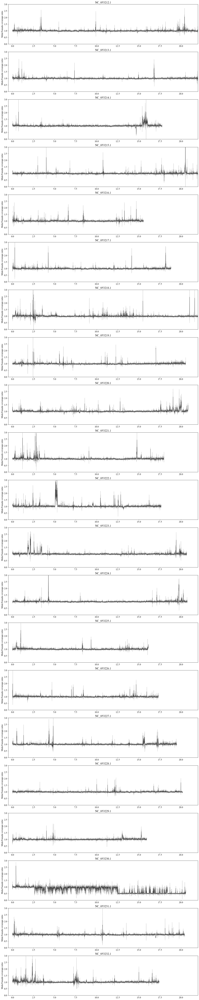

In [50]:
plot_data_out_Ga_AllScaffs_MFRatio = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/M_over_F_depths_GaAutoX.out", 
                                                  outfilepath = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga/Ga_M_over_F_depth_AutoX.pdf",
                                                  scaffs = Ga_scaffs,
                                                  figlims = (20,5),    
                                                  roll = 10, 
                                                  plot_male = False, plot_female = False, plot_ratio = True,
                                                  male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                                                  female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                                  ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                                  points_male = False, lines_male = True, fill_STD_male = True,
                                                  points_female = False, lines_female = True, fill_STD_female = True,
                                                  points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                                  male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                                  female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                                  ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                                  male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                                  myXlims = (-0.5,22), myYlims_ax1 = (0,3), myYlims_ax2 = (-0.5,4), 
                                                  moving_average_offset = 2500, avg_window = None, features = None,
                                                  highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                                  highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                                                  auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                                                  auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,                                                  
                                                  auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                                                  vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

The plotting function generates the datasets used below, so I need to plot all the stats (M, F, and M/F) even though this is not useful all on one plot. 

In [ ]:
plot_data_out_Ga_AllScaffs_AllStats = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/M_over_F_depths_GaAutoX.out", 
                                                   saveplot = False,
                                                   scaffs = Ga_scaffs,
                                                   figlims = (20,5),    
                                                   roll = 10, 
                                                   plot_male = True, plot_female = True, plot_ratio = True,
                                                   male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                                                   female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                                   ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                                   points_male = False, lines_male = True, fill_STD_male = True,
                                                   points_female = False, lines_female = True, fill_STD_female = True,
                                                   points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                                   male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                                   female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                                   ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                                   male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                                   myXlims = (-0.5,22), myYlims_ax1 = (0,3), myYlims_ax2 = (-0.5,4), 
                                                   moving_average_offset = 2500, avg_window = None, features = None,
                                                   highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                                   highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                                                   auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                                                   auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                                   auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                                                   vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


##### zorder only works for M and F, not ratio 

*** Generate some stats for highlighting if needed ***

In [13]:
high_windows_GaAutoX = highlight_windows(plot_data_out_Ga_AllScaffs_AllStats, 
                                         ["NC_053230.1"],
                                         Nstdevs = 1, 
                                         n = 2, 
                                         window_size = 1000)

Using 1 Stdevs around the mean

Finding highlight windows

Male:
  Mean = 2.35
  Stdev = 0.7
  Lower = 1.65
  Upper = 3.05

Female:
  Mean = 2.34
  Stdev = 0.71
  Lower = 1.63
  Upper = 3.05

Ratio:
  Mean = 1.01
  Stdev = 0.11
  Lower = 0.9
  Upper = 1.12
   6777 windows to highlight
   6.777 Mb of genome highlighted


#### Heterozygosity <a id="GaX_Heterozygosity"></a>

Heterozygosity was caculated for males and females separately at all loci using VCFtools (--hardy)

#### Coverage vs Heterozygosity <a id="GaX_Cov_vs_Het"></a>

Now we will compare coverage and heterozygosity data. We need to match the two datasets. The coverage is in 1kb bins, whereas the heterozygosity is per variant. So we need to bin variants and calculate average heterozygosity per 1kb bin. The Combine_covs_hets() function does this. 

##### Histograms <a id="GaX_Cov_vs_Het_histograms"></a>

I will plot some histograms of coverage and het to aid decisions around filtering thresholds later on

In [16]:
## Combine the cov and het data

Ga_AutoX_male_hets_path = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/heterozygosity/Ga.SNP.Q30.GQ20.meanDP10-50.minDP8_MALES.hwe"

Ga_cov_het_dict, Ga_cov_dict, Ga_het_dict = Combine_covs_hets(plot_data_out_Ga_AllScaffs_AllStats,                                                                                 
                                                              Ga_AutoX_male_hets_path)

NC_053212.1
NC_053213.1
NC_053214.1
NC_053215.1
NC_053216.1
NC_053217.1
NC_053218.1
NC_053219.1
NC_053220.1
NC_053221.1
NC_053222.1
NC_053223.1
NC_053224.1
NC_053225.1
NC_053226.1
NC_053227.1
NC_053228.1
NC_053229.1
NC_053230.1
NC_053231.1
NC_053232.1


In [19]:
## make the data for plotting (get heterozygosity means and track positions for the colours). 

import numpy as np

Ga_chr19_hets = []
Ga_chr19_covs = []
Ga_chr19_poss = [] ## for keeping track of positions

chrom = "NC_053230.1"
for window in Ga_cov_het_dict[chrom]:
    if len(Ga_cov_het_dict[chrom][window]["hets"]) >= 1:
        Ga_chr19_poss.append(window)
        Ga_chr19_hets.append(np.mean(Ga_cov_het_dict[chrom][window]["hets"]))
        Ga_chr19_covs.append(Ga_cov_het_dict[chrom][window]["M_F_cov"])
                 

#### Bin cov & het thresholds <a id="GaX_2n_Bins_loose_thresh"></a>

In [22]:
_2n_het_lower = 0.4
_2n_het_upper = 0.95
_2n_cov_lower = 0.8
_2n_cov_upper = 1.2

_1n_het_lower = 0.0
_1n_het_upper = 0.1
_1n_cov_lower = 0.4
_1n_cov_upper = 0.7

#### Plotting

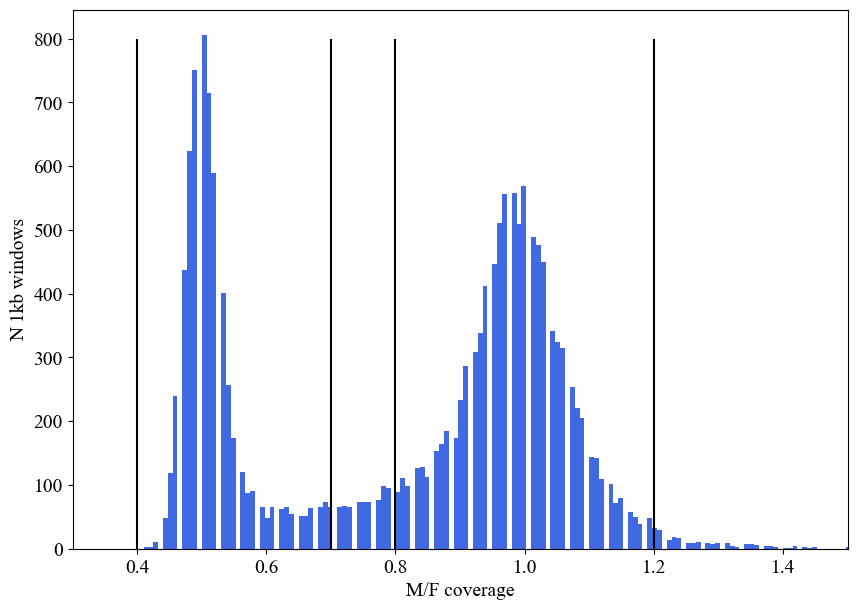

In [30]:
## plot coverage histogram

from matplotlib import pyplot as plt

fig = plt.figure(figsize=(10,7))

plt.hist(Ga_chr19_covs, bins = 300, color = "royalblue")
plt.xlim(0.3,1.5)
plt.ylabel("N 1kb windows")
plt.xlabel("M/F coverage")

## plot autosomal mean and half of that


plt.vlines(_1n_cov_lower,0,800, color = "black")
plt.vlines(_1n_cov_upper,0,800, color = "black")

plt.vlines(_2n_cov_lower,0,800, color = "black")
plt.vlines(_2n_cov_upper,0,800, color = "black")

plt.savefig("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga_MF_cov_histogram_1kb_window.pdf")
plt.show()

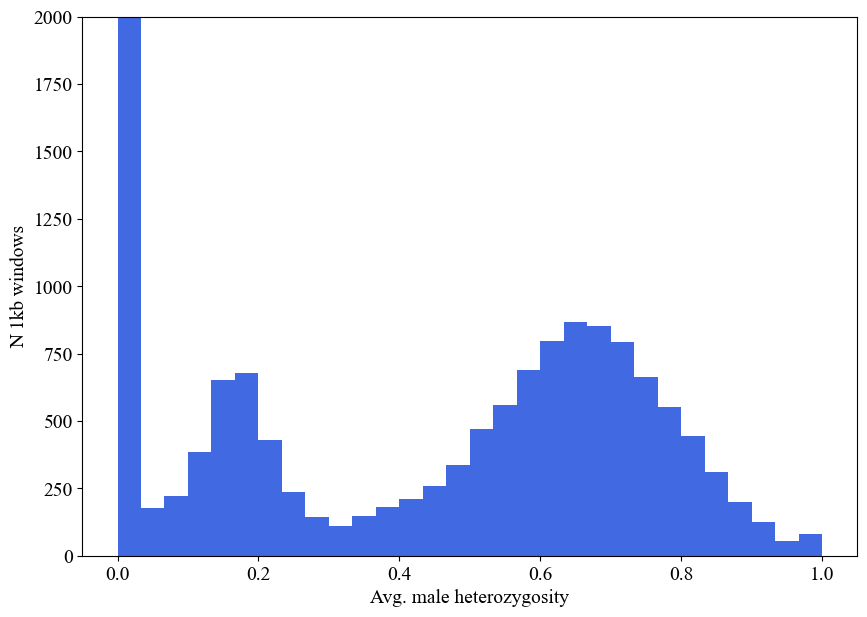

In [21]:
## plot the heterozygosity histogram

fig = plt.figure(figsize=(10,7))
plt.hist(Ga_chr19_hets, bins = 30, color = "royalblue")
plt.ylim(0,2000)  ## note the 0 bar goes much higher

plt.ylabel("N 1kb windows")
plt.xlabel("Avg. male heterozygosity")

plt.savefig("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga_MF_het_histogram_1kb_window.pdf")
plt.show()

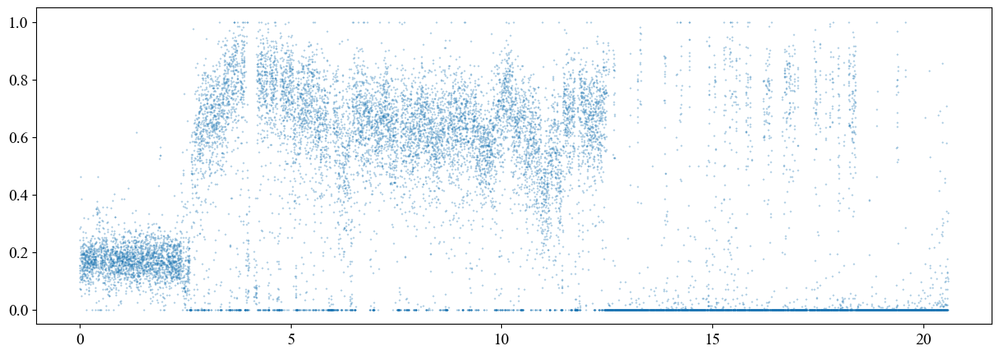

In [129]:
## Quick check of distribution of heterozygostiy along the chromosome

plt.figure(figsize = (15,5))
plt.scatter(Ga_chr19_poss, Ga_chr19_hets, s=0.2, alpha = 0.5)
#plt.vlines(2.6, 0,1, color = "black")
plt.show()

##### Coverage vs Heterozygosity scatter <a id="GaX_Cov_vs_Het_Scatter"></a>

The hope here is that the two will allow us to separate 2n and 1n windows.


/tmp/ipykernel_4866/2973247615.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])


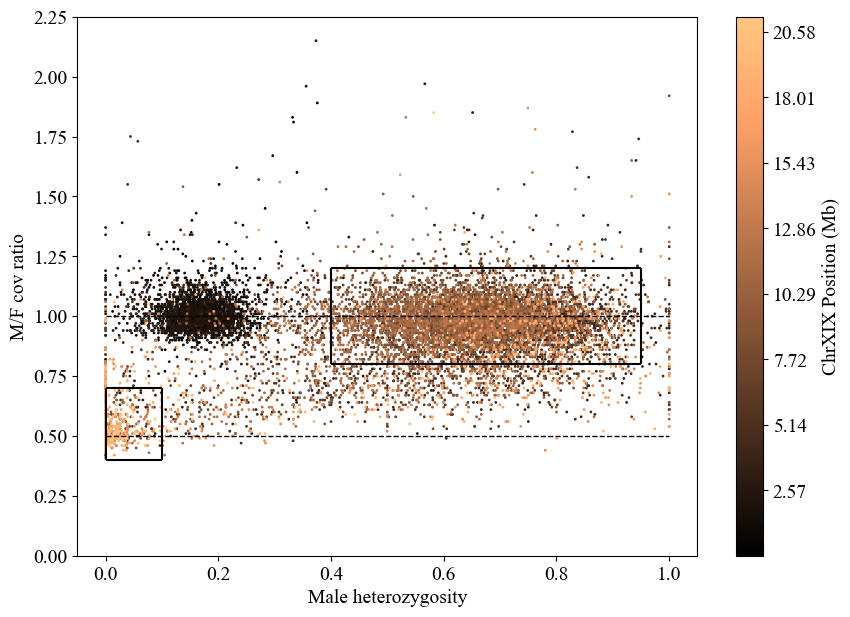

In [31]:
## plotting

plot = Plot_cov_het_scatter(Ga_chr19_hets, 
                     Ga_chr19_covs, 
                     Ga_chr19_poss,
                     rects = [[_2n_het_lower, _2n_het_upper, _2n_cov_lower, _2n_cov_upper], 
                              [_1n_het_lower, _1n_het_upper, _1n_cov_lower, _1n_cov_upper]],
                     rect_cols = ["black", "black"])

The combination of the two is indeed helpful. I have included some strict and loose filters with which we pulled out putative 2n bins. 

In [157]:
plot.savefig("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga_MvsF_cov_vs_Male_het_per_1kb_window.pdf")

### Isolating 1n and 2n bins <a id="GaX_2n_Bins"></a>

We need to decide on which windows to assign as 1n or 2n. This requires setting some thresholds, but where to set these? Ultimately we are always going to have windows with 2n and 1n regions so there are no perfect thresholds. 

That said, there are some clear clusters of windows in coverage and heterozygosities. Colouring by position also shows that there are some PAR regions mixed in everywhere. So I can filter by het, cov and pos. 



***For the 1n windows, I won't use heterozygosity as this will remove windows with no variants. So I will just use the cov thresholds***

In [32]:
## Make a list of the 2n windows to keep with loose thresholds, and visualise on the genome. 

kept_2n_windows = []
kept_2n_windows_dict = {}
kept_2n_windows_dict["NC_053230.1"] = {}
kept_2n_windows_dict["NC_053230.1"]["CENTRE"] = []
kept_2n_windows_dict["NC_053230.1"]["M_over_F_Cov_ratio"] = []

kept_1n_windows = []
kept_1n_windows_dict = {}
kept_1n_windows_dict["NC_053230.1"] = {}
kept_1n_windows_dict["NC_053230.1"]["CENTRE"] = []
kept_1n_windows_dict["NC_053230.1"]["M_over_F_Cov_ratio"] = []

### 2n windows

for window in Ga_cov_het_dict["NC_053230.1"]:
    if len(Ga_cov_het_dict["NC_053230.1"][window]['hets']) >= 1:
        if all([0.7 <= Ga_cov_het_dict["NC_053230.1"][window]['M_F_cov'] <= 1.3,
            0.4 <= np.mean(Ga_cov_het_dict["NC_053230.1"][window]['hets']) <= 0.95]):
            
            kept_2n_windows.append(window)
    
            kept_2n_windows_dict["NC_053230.1"]["CENTRE"].append(window)
            kept_2n_windows_dict["NC_053230.1"]["M_over_F_Cov_ratio"].append(Ga_cov_het_dict["NC_053230.1"][window]['M_F_cov'])

### 1n windows (coverage filter only)

for window in Ga_cov_het_dict["NC_053230.1"]:
    if len(Ga_cov_het_dict["NC_053230.1"][window]['hets']) >= 1:
        if all([window > 2.6,
               0.4 <= Ga_cov_het_dict["NC_053230.1"][window]['M_F_cov'] <= 0.7]):
                
            kept_1n_windows.append(window)
    
            kept_1n_windows_dict["NC_053230.1"]["CENTRE"].append(window)
            kept_1n_windows_dict["NC_053230.1"]["M_over_F_Cov_ratio"].append(Ga_cov_het_dict["NC_053230.1"][window]['M_F_cov'])



print("%s 1n windows" % len(kept_1n_windows))
print("%s 2n windows" % len(kept_2n_windows))



6203 1n windows
7798 2n windows


#### Visualising the 1n and 2n windows

Plotting scaffolds: NC_053230.1


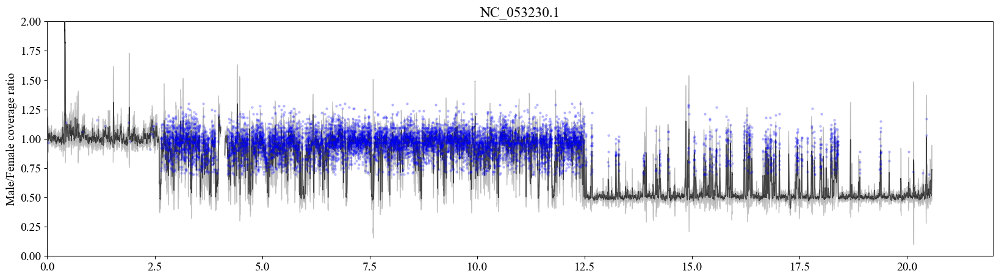

In [147]:
## 2n windows

plot_data_out_Ga_XIX = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/M_over_F_depths_GaAutoX.out", 
                                    outfilepath = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga/Ga_M_vs_F_depth_chr19_2n_windows.pdf",
                                    scaffs = ["NC_053230.1"],
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = False, plot_female = False, plot_ratio = True,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                    highlight_2n_windows_ratio = kept_2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)


Plotting scaffolds: NC_053230.1


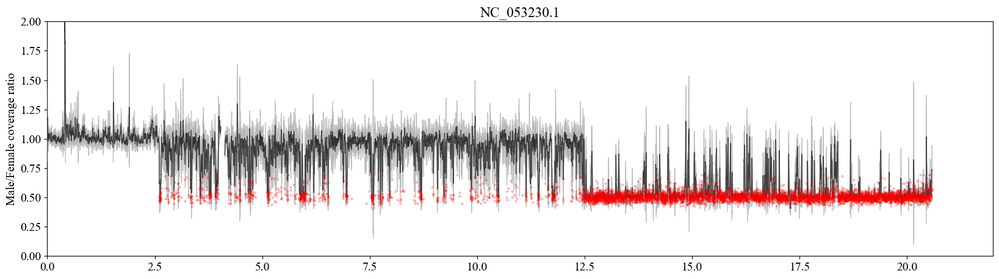

In [148]:
## 1n windows

plot_data_out_Ga_XIX = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/M_over_F_depths_GaAutoX.out", 
                                    outfilepath = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga/Ga_M_vs_F_depth_chr19_2n_windows.pdf",
                                    scaffs = ["NC_053230.1"],
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = False, plot_female = False, plot_ratio = True,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = kept_1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.2,
                                    highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




Plotting scaffolds: NC_053230.1


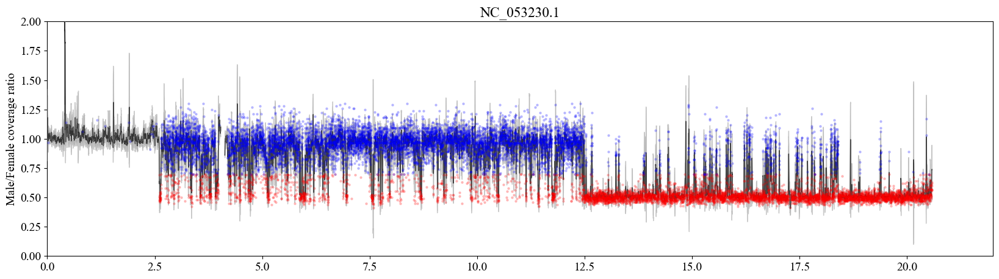

In [33]:
## both 1n and 2n windows

plot_data_out_Ga_XIX = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Ga/depths/M_over_F_depths_GaAutoX.out", 
                                    outfilepath = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/Ga/Ga_M_vs_F_depth_chr19_1n_and_2n_windows.pdf",
                                    scaffs = ["NC_053230.1"],
                                    figlims = (20,5),    
                                    roll = 10, 
                                    plot_male = False, plot_female = False, plot_ratio = True,
                                    male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                    female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                    ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                    points_male = False, lines_male = True, fill_STD_male = True,
                                    points_female = False, lines_female = True, fill_STD_female = True,
                                    points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                    male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                    female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                    ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                    male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                    myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                    moving_average_offset = 2500, avg_window = None, features = None,
                                    highlight_1n_windows_ratio = kept_1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.2,
                                    highlight_2n_windows_ratio = kept_2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                    auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                    auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                    auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                    vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




#### Outputting 1n and 2n windows <a id="GaX_2n_Bins_loose_out"></a>

In [34]:
with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Ga_2n_windows.tsv", 'w') as _2n_out:

    for window in kept_2n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        _2n_out.write("%s\t%s\t%s\n" % ("chr19", start, stop))

with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Ga_1n_windows.tsv", 'w') as _1n_out:

    for window in kept_1n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        _1n_out.write("%s\t%s\t%s\n" % ("chr19", start, stop))
    

## G. wheatlandi <a id="G.wheatlandi"></a>

Repeating the analysis for Gw now. Note that Gw has two X chromosomes, so we need to do everything twice.

In [35]:
## get males, females and scaffold names

samples_path = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/samples.txt" 

Gw_males = []
Gw_females = []

with open(samples_path) as samples:
    for sample in samples:
        if sample.strip().split("_")[1] == "M":
            Gw_males.append(sample.strip())
        elif sample.strip().split("_")[1] == "F":
            Gw_females.append(sample.strip())

Gw_scaffs = ["chr1","chr2","chr3","chr4","chr5","chr6","chr7","chr8","chr9","chr10","chr11","chr12","chr13","chr14","chr15",
             "chr16","chr17","chr18","chr19","chr20","chr21"]


### Chromosome X19 <a id="GwX19"></a>

#### Coverage <a id="GwX19_coverage"></a>

In [162]:
## combine depths file into one for all samples
Gw_scaff_dict_out = Combine_depths("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths",
                                   "depth",
                                   window_size = 1000)

Gw2a_M done!!
Gw1a_M done!!
Gw17_M done!!
Gw16_M done!!
Gw9a_M done!!
Gw6a_M done!!
2003QE_F_5 done!!
2007MA_F_1 done!!
Gw02_M done!!
2007MA_M_1 done!!
Gw06_F done!!
Gw08_M done!!
Gw07_F done!!
Gw5a_M done!!
2007MA_F_2 done!!
Gw4a_M done!!
Gw03_F done!!
2007MA_F_3 done!!
Gw14_M done!!
2003QE_F_3 done!!
2003QE_M_2 done!!
Gw12_M done!!
Gw8a_M done!!
Gw04_M done!!
Gw14_01f_F done!!
Gw10a_M done!!
Gw01_F done!!
Gw11a_M done!!
Gw05_M done!!
Gw7a_M done!!
2003QE_M_1 done!!
2007MA_M_2 done!!
2003ME_M_4 done!!
2007MA_M_3 done!!
2003ME_M_2 done!!
Gw15_M done!!

Done, output here: /home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/Combined_depths.out



In [36]:
Gw_M_covs, Gw_F_covs, = M_vs_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/Combined_depths.out",
                             "M_over_F_depths_GwAutoX.out",
                             males = Gw_males,
                             females = Gw_females,
                             min_cov = 0.1,
                             max_cov = 10)

Males found 26
Females found 9
filtered 3576 windows


Generating plotting data and plotting. 

Plotting scaffolds: chr1, chr2, chr3, chr4, chr5, chr6, chr7, chr8, chr9, chr10, chr11, chr12, chr13, chr14, chr15, chr16, chr17, chr18, chr19, chr20, chr21


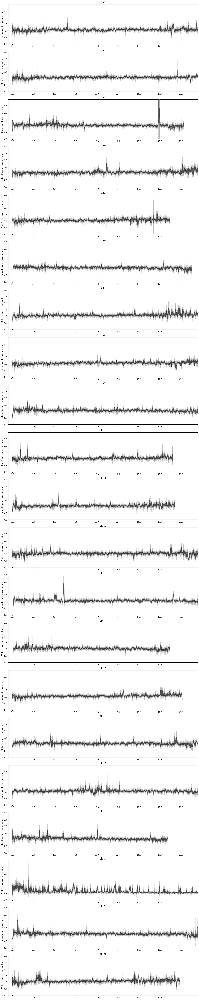

In [165]:
plot_data_out_Gw_AllScaffs_MFRatio = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                                  outfilepath = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/Ga_M_over_F_depth_AutoX.pdf",
                                                  scaffs = Gw_scaffs,
                                                  figlims = (20,5),    
                                                  roll = 10, 
                                                  plot_male = False, plot_female = False, plot_ratio = True,
                                                  male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                                                  female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                                  ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                                  points_male = False, lines_male = True, fill_STD_male = True,
                                                  points_female = False, lines_female = True, fill_STD_female = True,
                                                  points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                                  male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                                  female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                                  ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                                  male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                                  myXlims = (-0.5,22), myYlims_ax1 = (0,3), myYlims_ax2 = (-0.5,4), 
                                                  moving_average_offset = 2500, avg_window = None, features = None,
                                                  highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                                  highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                                                  auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                                                  auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                                  auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                                                  vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)

##### zorder only works for M and F, not ratio 

In [ ]:
plot_data_out_Gw_AllScaffs_AllStats = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                                   saveplot = False,                             
                                                   scaffs = Gw_scaffs,
                                                   figlims = (20,5),    
                                                   roll = 10, 
                                                   plot_male = True, plot_female = True, plot_ratio = True,
                                                   male_points_color = "royalblue", male_fill_color = "dodgerblue" , male_line_color = "darkblue",
                                                   female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                                   ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                                   points_male = False, lines_male = True, fill_STD_male = True,
                                                   points_female = False, lines_female = True, fill_STD_female = True,
                                                   points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                                   male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                                   female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                                   ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                                   male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                                   myXlims = (-0.5,22), myYlims_ax1 = (0,3), myYlims_ax2 = (-0.5,4), 
                                                   moving_average_offset = 2500, avg_window = None, features = None,
                                                   highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                                   highlight_2n_windows_ratio = None, highlight_2n_color = "blue", highlight_2n_alpha = 0.05,
                                                   auto_average_male = None, auto_average_male_color = "blue", auto_average_male_alpha = 0.5, 
                                                   auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                                   auto_average_ratio = None, auto_average_ratio_color = "green", auto_average_ratio_alpha = 0.5,
                                                   vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)

##### zorder only works for M and F, not ratio 

***Generate some stats for highlighting if needed*** 

In [38]:
high_windows_GwAutoX = highlight_windows(plot_data_out_Gw_AllScaffs_AllStats, 
                                         ["chr19", "chr12"],
                                         Nstdevs = 1, 
                                         n = 2, 
                                         window_size = 1000)

Using 1 Stdevs around the mean

Finding highlight windows

Male:
  Mean = 2.09
  Stdev = 0.54
  Lower = 1.55
  Upper = 2.63

Female:
  Mean = 2.0
  Stdev = 0.59
  Lower = 1.41
  Upper = 2.59

Ratio:
  Mean = 1.07
  Stdev = 0.16
  Lower = 0.91
  Upper = 1.23
   18194 windows to highlight
   18.194 Mb of genome highlighted


#### Heterozygosity <a id="GwX19_Heterozygosity"></a>

Heterozygosities were calculated for males and females separately at all loci in the genome, using VCFtools (--hardy)

Using average heterozygosity per window in this way is not as straightforward as it first seems. The expectation is that males cannot be heterozygous in windows which have been lost on the Y. Thus I need to allow for loci with zero male heterozygotes. However, there can also be loci with 0 male heterozygotes in 2n regions, as low frequency alleles which just happen to be found in females only will show the same patter. With many of these in the genome, the heterozygosity of a given window is reduced. 

I can require at least 1 male heterozygote in a window, but this is then removes loci for which there are zero males because of a lack of this locus on the Y - which is exactly the signal we want. 

I could try filtering the dataset for loci that have a minimum allele frequency above a certain threshold. However I think that my heterozygosity bias method is the correct approach here. For loci with a very low freq allele, the P-val would be very high, so no sex linkage detected. I could do this for an autosome, find the distribution, and take the p-val at the 95th percentile. Then I cound the number of loci in each window that are above this in the sex chromosomes. So this is basically calculating the "Sex-linked SNP density" per window. . . . which I think should be pretty informative. . . . the journey continues . . . 


#### Coverage vs Heterozygosity <a id="GwX19_Cov_vs_Het"></a>

Now we will compare coverage and heterozygosity data. We need to match the two datasets. The coverage is in 1kb bins, whereas the heterozygosity is per variant. So we need to bin variants and calculate average heterozygosity per 1kb bin. The Combine_covs_hets() function does this. 

##### Histograms <a id="GwX19_Cov_vs_Het_histograms"></a>
- Darkblue = autosomal mean
- Grey = loose cutoffs
- Black = tight cutoffs

In [39]:
Gw_AutoX_male_hets_path = "/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/heterozygosity/Gw.Sardell.Wild.puresamples.SNP.Q30.GQ20.minDP8_MALES.hwe"

Gw_all_cov_het_dict, Gw_all_cov_dict, Gw_all_het_dict = Combine_covs_hets(plot_data_out_Gw_AllScaffs_AllStats, 
                                                                          Gw_AutoX_male_hets_path)


chr1
chr2
chr3
chr4
chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20
chr21


I will plot some histograms first, to see how the two distributions look and to help make decisions on cutoffs later

In [40]:
### Get the autosomal average for heterozygosity

sex_linked_chroms = ["chr19","chr12"]

auto_hets = []

for chrom in Gw_all_cov_het_dict:
    
    if chrom not in sex_linked_chroms:
        
        #print(chrom)
    
        for window in Gw_all_cov_het_dict[chrom]:
            if len(Gw_all_cov_het_dict[chrom][window]["hets"]) >= 1:
                auto_hets.append(np.mean(Gw_all_cov_het_dict[chrom][window]["hets"]))
            
avg_auto_het = np.round(np.mean(auto_hets),2)

print("Autosomal avg. Het = %s" % avg_auto_het)
            

Autosomal avg. Het = 0.06


### Chr 19 

The ancestral and neo-sex chrom in blackspotted are so different that I will need to do this separately for both of them.

In [60]:
## make the data for plotting (get heterozygosity means and track positions for the colours). 

## For chromosome 19

Gw_AutoX19_hets = []
Gw_AutoX19_covs = []
Gw_AutoX19_poss = [] ## for keeping track of positions

for window in Gw_all_cov_het_dict["chr19"]:
    #if len(Gw_all_cov_het_dict["chr19"][window]["hets"]) == 0:
    Gw_AutoX19_poss.append(window)
    Gw_AutoX19_covs.append(Gw_all_cov_het_dict["chr19"][window]["M_F_cov"])



### Set cov and het thresholds

In [61]:
Gw_chr19_1n_cov_lower = 0.4
Gw_chr19_1n_cov_upper = 0.6
Gw_chr19_2n_cov_lower = 0.8
Gw_chr19_2n_cov_upper = 1.2


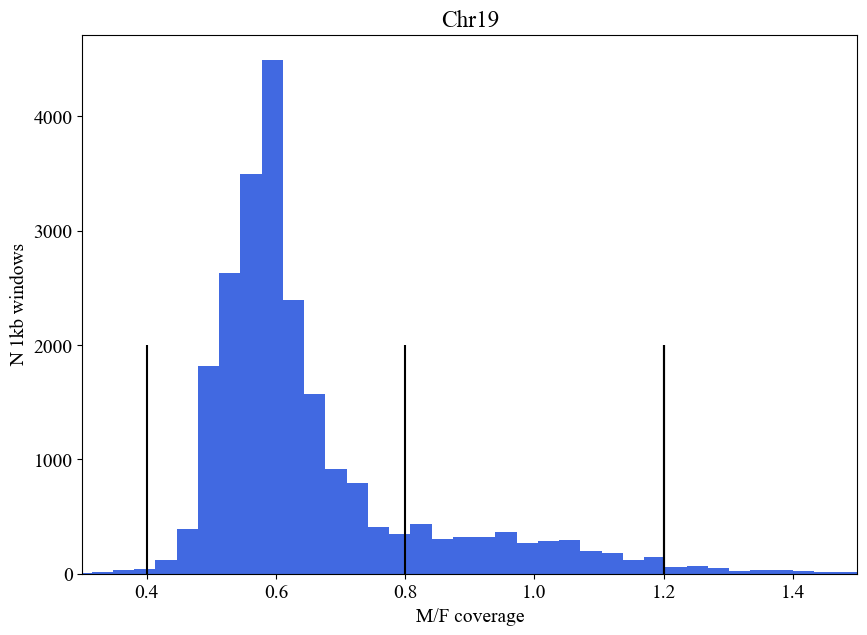

In [63]:
fig = plt.figure(figsize=(10,7))

plt.hist(Gw_AutoX19_covs, bins = 100, color = "royalblue")
plt.xlim(0.3,1.5)

plt.vlines(Gw_chr19_1n_cov_lower,0,2000, color = "black")
plt.vlines(Gw_chr19_2n_cov_upper,0,2000, color = "black")

plt.vlines(Gw_chr19_2n_cov_lower,0,2000, color = "black")
plt.vlines(Gw_chr19_2n_cov_upper,0,2000, color = "black")

plt.title("Chr19")
plt.ylabel("N 1kb windows")
plt.xlabel("M/F coverage")


plt.show()

In [64]:
## make the data for plotting (get heterozygosity means and track positions for the colours). 

## For chromosome 19

Gw_AutoX19_hets = []
Gw_AutoX19_covs = []
Gw_AutoX19_poss = [] ## for keeping track of positions

for window in Gw_all_cov_het_dict["chr19"]:
    if len(Gw_all_cov_het_dict["chr19"][window]["hets"]) >= 1:
        Gw_AutoX19_poss.append(window)
        Gw_AutoX19_hets.append(np.mean(Gw_all_cov_het_dict["chr19"][window]["hets"]))
        Gw_AutoX19_covs.append(Gw_all_cov_het_dict["chr19"][window]["M_F_cov"])



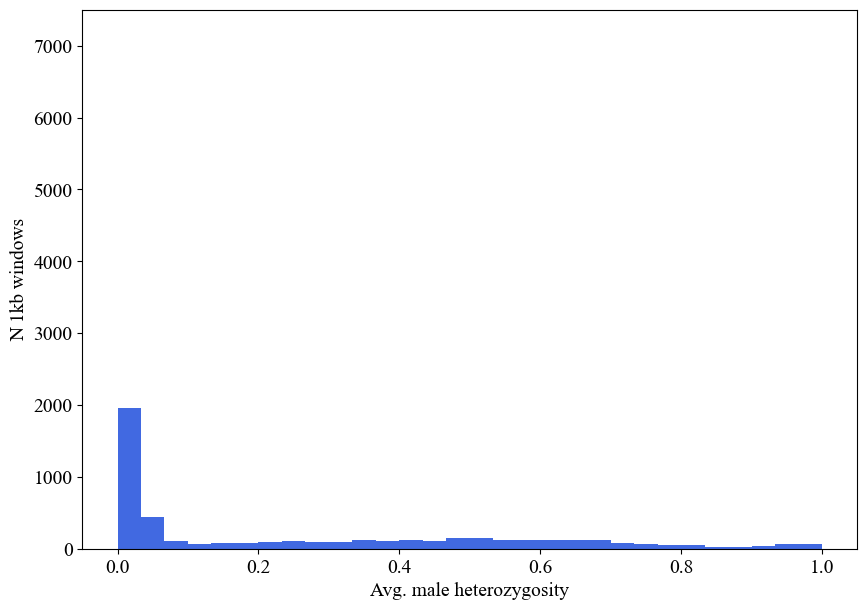

In [65]:
fig = plt.figure(figsize=(10,7))
plt.hist(Gw_AutoX19_hets, bins = 30, color = "royalblue")
plt.ylim(0,7500)  ## note the 0 bar goes much higher


plt.ylabel("N 1kb windows")
plt.xlabel("Avg. male heterozygosity")

#plt.savefig("/Users/dj20y461/Data_temp/Stickleback/Y_comp/2n_windows/Gw/Autos_X/Male_Chr19_het_per_1kb_window.pdf")
plt.show()

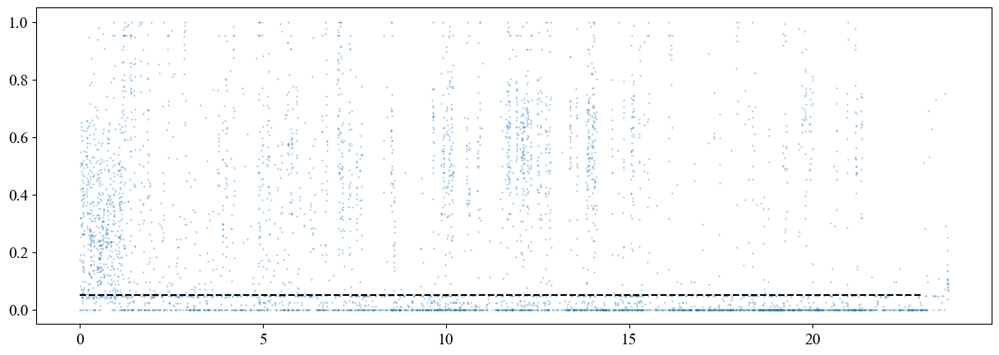

In [66]:
plt.figure(figsize = (15,5))
plt.scatter(Gw_AutoX19_poss, Gw_AutoX19_hets, s=0.2, alpha = 0.5)
plt.hlines(0.05, 0, 23, linestyle = "dashed", color = "black")
plt.show()

##### Coverage vs Heterozygosity scatter <a id="GwX19_Cov_vs_Het_Scatter"></a>

The hope here is that the two will allow us to separate 2n and 1n windows.


/tmp/ipykernel_4866/2973247615.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])


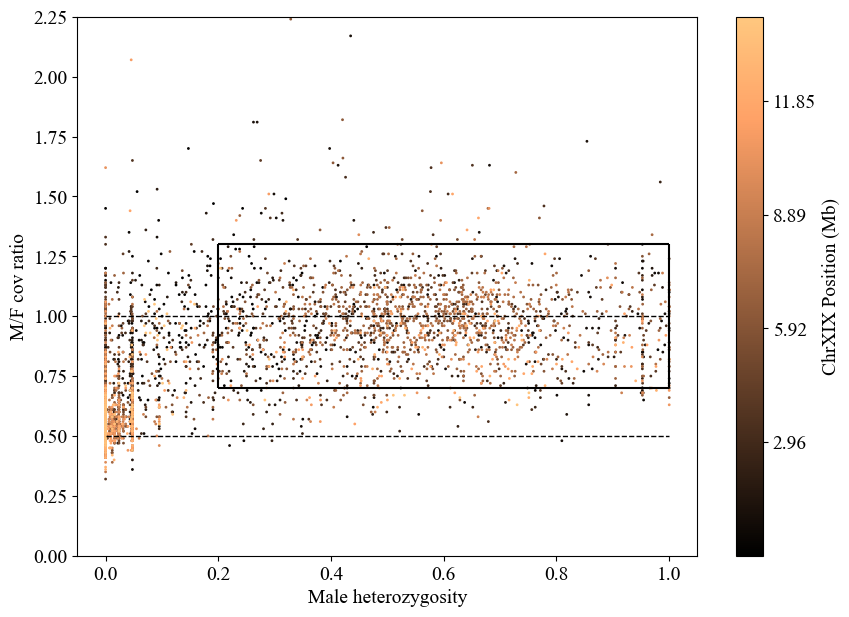

In [70]:
## plotting

## add the cutoffs
Gw_chr19_2n_het_lower = 0.2
Gw_chr19_2n_het_upper = 1
Gw_chr19_2n_cov_lower = 0.7
Gw_chr19_2n_cov_upper = 1.3

plot = Plot_cov_het_scatter(Gw_AutoX19_hets, 
                     Gw_AutoX19_covs, 
                     Gw_AutoX19_poss,
                     rects = [[Gw_chr19_2n_het_lower, Gw_chr19_2n_het_upper, Gw_chr19_2n_cov_lower, Gw_chr19_2n_cov_upper]],
                              rect_cols = ["black"])

In [71]:
plot.savefig("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/plots/M_F_stats_plots/G1_Chr19_MvsF_cov_vs_Male_het_per_1kb_window.pdf")

#### Isolating putatively 2n bins <a id="GwX19_2n_Bins"></a>

For Gw, the choice of thresholds is less clear, as there are very few 2n windows compared to Ga. So I will just take a single set of windows. The thresholds will be relatively strict, as I suspect (based on the lack of a coverage mode at 1.0, most windows contain at least some sequence loss on the Y. However, I hope to retain windows that are mostly 2n. 

Still, I will plot the putatively 2n windows on the genome. 

#### Putatively 2n bin positions <a id="GwX19_2n_Bins"></a>

In [80]:
## Make a list of the 2n windows to keep with loose thresholds, and visualise on the genome. 

Gw_2n_windows = []
Gw_2n_windows_dict = {}
Gw_2n_windows_dict["chr19"] = {}
Gw_2n_windows_dict["chr19"]["CENTRE"] = []
Gw_2n_windows_dict["chr19"]["M_over_F_Cov_ratio"] = []

for window in Gw_all_cov_het_dict["chr19"]:
    if all([Gw_chr19_2n_cov_lower <= Gw_all_cov_het_dict["chr19"][window]['M_F_cov'] <= Gw_chr19_2n_cov_upper,
            Gw_chr19_2n_het_lower <= np.mean(Gw_all_cov_het_dict["chr19"][window]['hets']) <= Gw_chr19_2n_het_upper]):
            
        Gw_2n_windows.append(window)

        Gw_2n_windows_dict["chr19"]["CENTRE"].append(window)
        Gw_2n_windows_dict["chr19"]["M_over_F_Cov_ratio"].append(Gw_all_cov_het_dict["chr19"][window]['M_F_cov'])
            
print(len(Gw_2n_windows))



1768


/home/djeffrie/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/djeffrie/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Plotting scaffolds: chr19

## Note - not saving to pdf


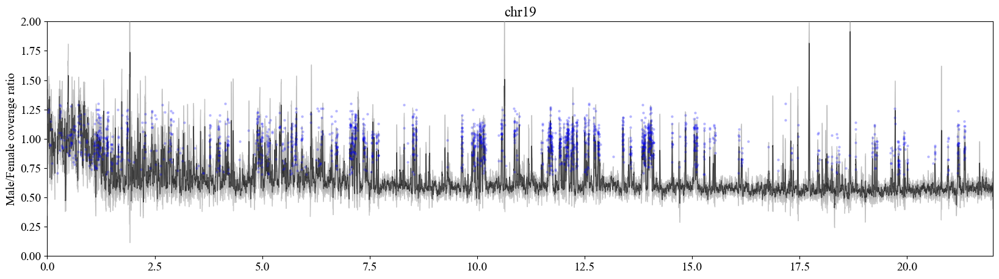

In [81]:
plot_data_out_Gw_Chr19 = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                      saveplot = False,
                                      scaffs = ["chr19"],
                                      figlims = (20,5),    
                                      roll = 10, 
                                      plot_male = False, plot_female = False, plot_ratio = True,
                                      male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                      female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                      ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                      points_male = False, lines_male = True, fill_STD_male = True,
                                      points_female = False, lines_female = True, fill_STD_female = True,
                                      points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                      male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                      female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                      ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                      male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                      myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                      moving_average_offset = 2500, avg_window = None, features = None,
                                      highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                      highlight_2n_windows_ratio = Gw_2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                      auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                      auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                      auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                      vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




##### Outputting 2n bins <a id="GwX19_2n_bins_out"></a>

In [82]:
with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Gw_Chr19_2n_windows.tsv", 'w') as loose_out:

    for window in Gw_2n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        loose_out.write("%s\t%s\t%s\n" % ("chr19",start, stop))
    

#### Putatively 1n bin positions <a id="GwX19_1n_Bins"></a>

In [77]:
## Make a list of the 2n windows to keep with loose thresholds, and visualise on the genome. 

Gw_1n_windows = []
Gw_1n_windows_dict = {}
Gw_1n_windows_dict["chr19"] = {}
Gw_1n_windows_dict["chr19"]["CENTRE"] = []
Gw_1n_windows_dict["chr19"]["M_over_F_Cov_ratio"] = []

for window in Gw_all_cov_het_dict["chr19"]:
    if all([Gw_chr19_1n_cov_lower <= Gw_all_cov_het_dict["chr19"][window]['M_F_cov'] <= Gw_chr19_1n_cov_upper]):
            
        Gw_1n_windows.append(window)

        Gw_1n_windows_dict["chr19"]["CENTRE"].append(window)
        Gw_1n_windows_dict["chr19"]["M_over_F_Cov_ratio"].append(Gw_all_cov_het_dict["chr19"][window]['M_F_cov'])
            
print(len(Gw_1n_windows))



11903


Plotting scaffolds: chr19

## Note - not saving to pdf


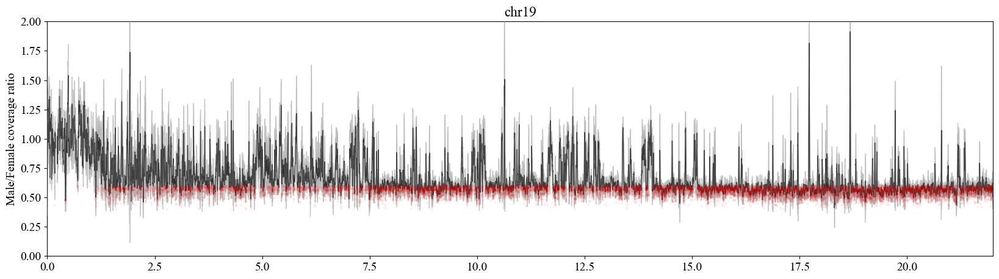

In [78]:
plot_data_out_Gw_Chr19 = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                      saveplot = False,
                                      scaffs = ["chr19"],
                                      figlims = (20,5),    
                                      roll = 10, 
                                      plot_male = False, plot_female = False, plot_ratio = True,
                                      male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                      female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                      ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                      points_male = False, lines_male = True, fill_STD_male = True,
                                      points_female = False, lines_female = True, fill_STD_female = True,
                                      points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                      male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                      female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                      ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                      male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                      myXlims = (0,22), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                      moving_average_offset = 2500, avg_window = None, features = None,
                                      highlight_1n_windows_ratio = Gw_1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.05,
                                      auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                      auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                      auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                      vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




##### Outputting 1n bins <a id="GwX19_2n_bins_out"></a>

In [83]:
with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Gw_Chr19_1n_windows.tsv", 'w') as loose_out:

    for window in Gw_1n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        loose_out.write("%s\t%s\t%s\n" % ("chr19",start, stop))
    

### Chromosome X12 <a id="GwX12"></a>

In [91]:
## For chromosome 12

Gw_AutoX12_hets = []
Gw_AutoX12_covs = []
Gw_AutoX12_poss = [] ## for keeping track of positions

for window in Gw_all_cov_het_dict["chr12"]:
    if len(Gw_all_cov_het_dict["chr12"][window]["hets"]) > 0:
        Gw_AutoX12_poss.append(window)
        Gw_AutoX12_hets.append(np.mean(Gw_all_cov_het_dict["chr12"][window]["hets"]))
        Gw_AutoX12_covs.append(Gw_all_cov_het_dict["chr12"][window]["M_F_cov"])

#### Coverage vs Heterozygosity <a id="GwX12_Cov_vs_Het"></a>

Coverage and heterozygosity were already calculated above for the X19 analyses, so we can jump straight to the Cov vs Het analyses for ChrX12

##### Histograms <a id="GwX12_Cov_vs_Het_histograms"></a>
- Darkblue = autosomal mean
- Grey = loose cutoffs
- Black = tight cutoffs

### Set cov and het thresholds

In [85]:
Gw_chr12_1n_het_lower = 0.0
Gw_chr12_1n_het_upper = 0.1
Gw_chr12_1n_cov_lower = 0.4
Gw_chr12_1n_cov_upper = 0.7

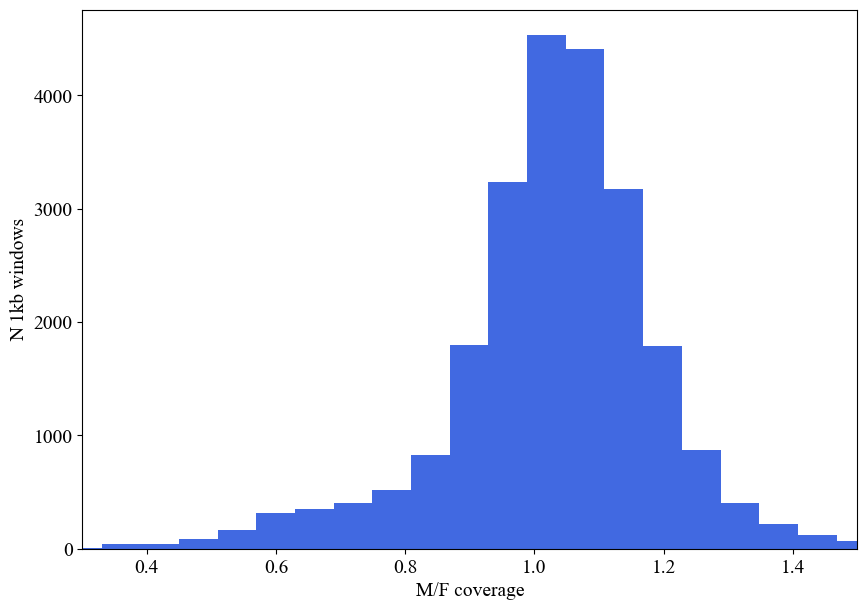

In [87]:
fig = plt.figure(figsize=(10,7))

plt.hist(Gw_AutoX12_covs, bins = 100, color = "royalblue")
plt.xlim(0.3,1.5)
plt.ylabel("N 1kb windows")
plt.xlabel("M/F coverage")

#plt.savefig("/Users/dj20y461/Data_temp/Stickleback/Y_comp/2n_windows/Gw/Autos_X/MF_Chr12_cov_per_1kb_window.pdf")
plt.show()

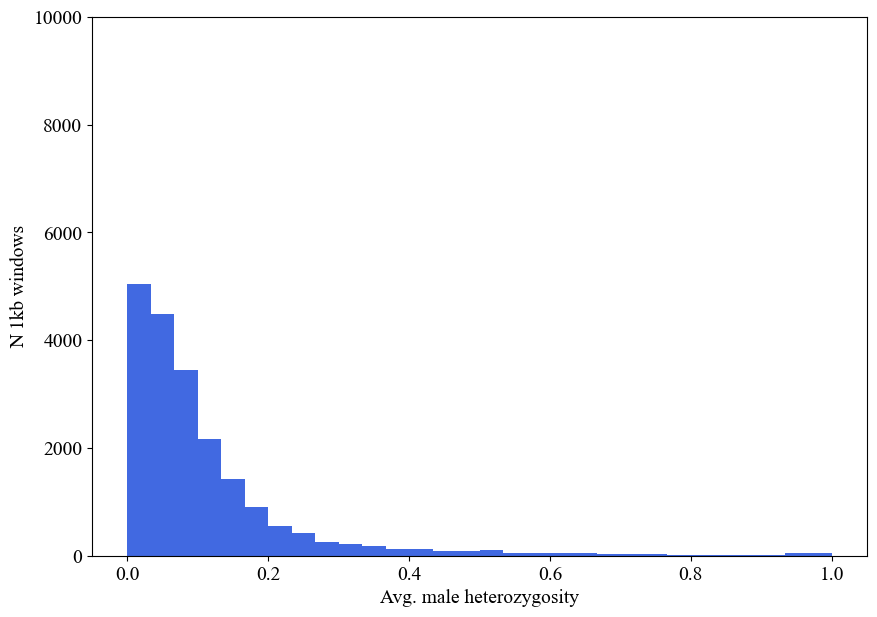

In [92]:
fig = plt.figure(figsize=(10,7))
plt.hist(Gw_AutoX12_hets, bins = 30, color = "royalblue")
plt.ylim(0,10000)  ## note the 0 bar goes much higher


plt.ylabel("N 1kb windows")
plt.xlabel("Avg. male heterozygosity")

#plt.savefig("/Users/dj20y461/Data_temp/Stickleback/Y_comp/2n_windows/Gw/Autos_X/Male_Chr12_het_per_1kb_window.pdf")
plt.show()

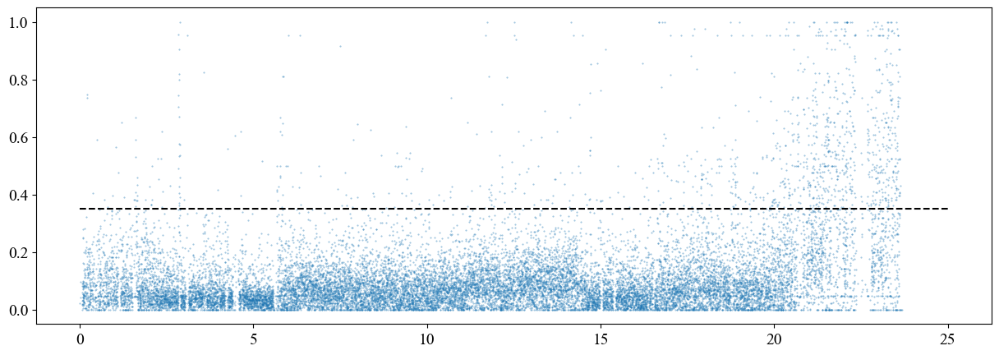

In [90]:
plt.figure(figsize = (15,5))
plt.scatter(Gw_AutoX12_poss, Gw_AutoX12_hets, s=0.2, alpha = 0.5)
plt.hlines(0.35, 0, 25, linestyle = "dashed", color = "black") ## auto average
plt.show()

Ok, so heterozygosity is a somewhat dangerous stat to use. . . . at least the way I calculated it. I am using male hwe for all loci in the dataset, but many are not polymorphic in males. Having loads of these reduces the window average het. So I set a threshold for the number of heterozygous males 1. Which vastly improves things. 

##### Coverage vs Heterozygosity scatter <a id="GwX12_Cov_vs_Het_Scatter"></a>

/tmp/ipykernel_4866/2973247615.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([np.round(i,2) for i in np.linspace(0, max(poss), 9)])


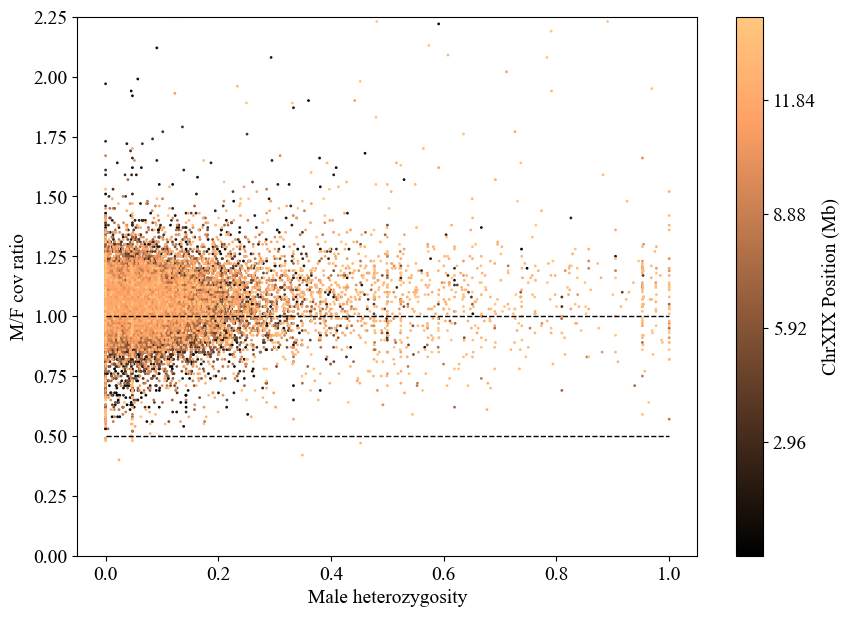

In [95]:
## plotting

het_lower = 0.1
het_upper = 1
cov_lower = 0.75
cov_upper = 1.25

plot = Plot_cov_het_scatter(Gw_AutoX12_hets, 
                     Gw_AutoX12_covs, 
                     Gw_AutoX12_poss)

In [1130]:
plot.savefig("/Users/dj20y461/Data_temp/Stickleback/Y_comp/2n_windows/Gw/Autos_X/Chr12_Mf_cov_vs_Male_het_per_1kb_window.pdf")

#### Isolating putatively 2n bins <a id="GwX12_2n_Bins"></a>

For X12, the choice of thresholds is even less clear, as basically every window is 2n. I will basically just rely on coverage, from about 0.75 to 1.25

Still, I will plot the putatively 2n windows on the genome. 

#### Putatively 2n bin positions <a id="GwX19_2n_Bins"></a>

In [96]:
Gw_chr12_2n_cov_lower = 0.75
Gw_chr12_2n_cov_upper = 1.3

In [100]:
Gw_chr12_2n_windows = []
Gw_chr12_2n_windows_dict = {}
Gw_chr12_2n_windows_dict["chr12"] = {}
Gw_chr12_2n_windows_dict["chr12"]["CENTRE"] = []
Gw_chr12_2n_windows_dict["chr12"]["M_over_F_Cov_ratio"] = []

for window in Gw_all_cov_het_dict["chr12"]:
    if all([Gw_chr19_2n_cov_lower <= Gw_all_cov_het_dict["chr12"][window]['M_F_cov'] <= Gw_chr12_2n_cov_upper]):
            
        Gw_chr12_2n_windows.append(window)

        Gw_chr12_2n_windows_dict["chr12"]["CENTRE"].append(window)
        Gw_chr12_2n_windows_dict["chr12"]["M_over_F_Cov_ratio"].append(Gw_all_cov_het_dict["chr12"][window]['M_F_cov'])
            
print(len(Gw_chr12_2n_windows))

21651


Plotting scaffolds: chr12

## Note - not saving to pdf


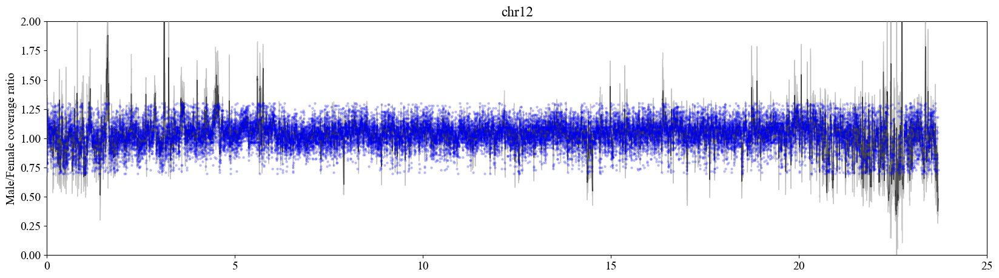

In [101]:
plot_data_out_Gw_Chr19 = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                      saveplot = False, 
                                      scaffs = ["chr12"],
                                      figlims = (20,5),    
                                      roll = 10, 
                                      plot_male = False, plot_female = False, plot_ratio = True,
                                      male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                      female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                      ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                      points_male = False, lines_male = True, fill_STD_male = True,
                                      points_female = False, lines_female = True, fill_STD_female = True,
                                      points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                      male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                      female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                      ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                      male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                      myXlims = (0,25), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                      moving_average_offset = 2500, avg_window = None, features = None,
                                      highlight_1n_windows_ratio = None, highlight_1n_color = "red", highlight_1n_alpha = 0.01,
                                      highlight_2n_windows_ratio = Gw_chr12_2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                      auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                      auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                      auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                      vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




##### Outputting 2n bins <a id="GwX12_2n_bins_out"></a>

In [108]:
with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Gw_Chr12_2n_windows.tsv", 'w') as loose_out:

    for window in Gw_chr12_2n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        loose_out.write("%s\t%s\t%s\n" % ("chr12",start, stop))
    

#### Putatively 1n bin positions <a id="GwX19_2n_Bins"></a>

In [102]:
Gw_chr12_1n_cov_lower = 0.3
Gw_chr12_1n_cov_upper = 0.7

In [103]:
Gw_chr12_1n_windows = []
Gw_chr12_1n_windows_dict = {}
Gw_chr12_1n_windows_dict["chr12"] = {}
Gw_chr12_1n_windows_dict["chr12"]["CENTRE"] = []
Gw_chr12_1n_windows_dict["chr12"]["M_over_F_Cov_ratio"] = []

for window in Gw_all_cov_het_dict["chr12"]:
    if all([Gw_chr19_1n_cov_lower <= Gw_all_cov_het_dict["chr12"][window]['M_F_cov'] <= Gw_chr12_1n_cov_upper]):
            
        Gw_chr12_1n_windows.append(window)

        Gw_chr12_1n_windows_dict["chr12"]["CENTRE"].append(window)
        Gw_chr12_1n_windows_dict["chr12"]["M_over_F_Cov_ratio"].append(Gw_all_cov_het_dict["chr12"][window]['M_F_cov'])
            
print(len(Gw_chr12_1n_windows))

1097


Plotting scaffolds: chr12

## Note - not saving to pdf


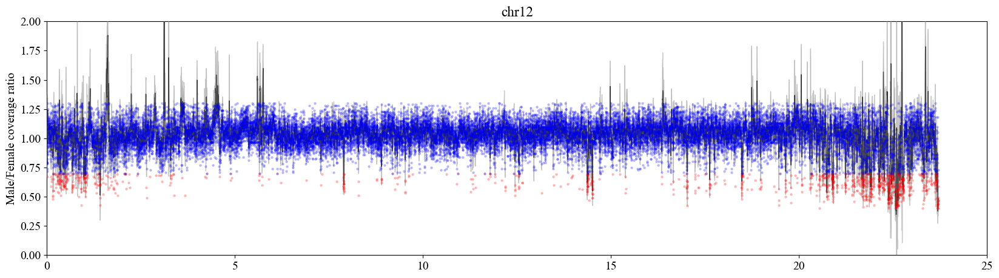

In [106]:
plot_data_out_Gw_Chr19 = Plot_M_F_cov("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/data/Gw/depths/M_over_F_depths_GwAutoX.out", 
                                      saveplot = False, 
                                      scaffs = ["chr12"],
                                      figlims = (20,5),    
                                      roll = 10, 
                                      plot_male = False, plot_female = False, plot_ratio = True,
                                      male_points_color = "blue", male_fill_color = "royalblue" , male_line_color = "darkblue",
                                      female_points_color = "firebrick", female_fill_color = "firebrick", female_line_color = "maroon",
                                      ratio_points_color = "grey", ratio_fill_color = "grey", ratio_line_color = "black",
                                      points_male = False, lines_male = True, fill_STD_male = True,
                                      points_female = False, lines_female = True, fill_STD_female = True,
                                      points_ratio = False, lines_ratio = True, fill_STD_ratio = True,
                                      male_points_alpha = 0.5, male_fill_alpha = 0.4 , male_line_alpha = 0.8,
                                      female_points_alpha = 0.5, female_fill_alpha = 0.4, female_line_alpha = 0.8,
                                      ratio_points_alpha = 0.5, ratio_fill_alpha = 0.4, ratio_line_alpha = 1,
                                      male_zorder = 1, female_zorder = 2, ratio_zorder = 3,
                                      myXlims = (0,25), myYlims_ax1 = (0,2), myYlims_ax2 = (-0.5,4), 
                                      moving_average_offset = 2500, avg_window = None, features = None,
                                      highlight_1n_windows_ratio = Gw_chr12_1n_windows_dict, highlight_1n_color = "red", highlight_1n_alpha = 0.2,
                                      highlight_2n_windows_ratio = Gw_chr12_2n_windows_dict, highlight_2n_color = "blue", highlight_2n_alpha = 0.2,
                                      auto_average_male = None, auto_average_male_color = "black", auto_average_male_alpha = 0.5, 
                                      auto_average_female = None, auto_average_female_color = "red", auto_average_female_alpha = 0.5,
                                      auto_average_ratio = None, auto_average_ratio_color = "black", auto_average_ratio_alpha = 0.5,
                                      vertical_separators = None, vertical_separator_color = "black", vertical_separator_alpha = 0.5)




Many, if not most are in the oldest part of Chr12, which is reassuring. The handful that we ignore elsewhere don't matter too much. 

##### Outputting 1n bins <a id="GwX12_2n_bins_out"></a>

In [109]:
with open("/home/djeffrie/Data/Stickleback/Stickle_Y_comp/results/Gw_Chr12_1n_windows.tsv", 'w') as loose_out:

    for window in Gw_chr12_1n_windows:

        start = int((window-0.0005)*1000000)
        stop = int((window+0.0005)*1000000)

        loose_out.write("%s\t%s\t%s\n" % ("chr12",start, stop))
    